In [38]:
import sys
sys.path.append("../") # adding the path to read the utils file
from sklearnex import patch_sklearn
patch_sklearn(global_patch=True)
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn import metrics, tree
from shap import TreeExplainer
import fasttreeshap
from shap import plots, Explanation
import graphviz 
from yellowbrick.model_selection import LearningCurve
import time
import shap
from utils import *
import pickle
import glob
from yellowbrick.classifier import ROCAUC
from yellowbrick.contrib.wrapper import wrap
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier

pd.set_option('display.max_columns', None)

Scikit-learn was successfully globally patched by Intel(R) Extension for Scikit-learn


Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [39]:
ds = pd.concat([pd.read_csv(csv_file, engine='pyarrow', index_col='id') for csv_file in glob.glob('../datasets/NFS-2023-TE/*.csv')], ignore_index=True)
ds.head()

,expiration_id,src_ip,src_mac,src_oui,src_port,dst_ip,dst_mac,dst_oui,dst_port,protocol,ip_version,vlan_id,bidirectional_first_seen_ms,bidirectional_last_seen_ms,bidirectional_duration_ms,bidirectional_packets,bidirectional_bytes,src2dst_first_seen_ms,src2dst_last_seen_ms,src2dst_duration_ms,src2dst_packets,src2dst_bytes,dst2src_first_seen_ms,dst2src_last_seen_ms,dst2src_duration_ms,dst2src_packets,dst2src_bytes,bidirectional_min_ps,bidirectional_mean_ps,bidirectional_stddev_ps,bidirectional_max_ps,src2dst_min_ps,src2dst_mean_ps,src2dst_stddev_ps,src2dst_max_ps,dst2src_min_ps,dst2src_mean_ps,dst2src_stddev_ps,dst2src_max_ps,bidirectional_min_piat_ms,bidirectional_mean_piat_ms,bidirectional_stddev_piat_ms,bidirectional_max_piat_ms,src2dst_min_piat_ms,src2dst_mean_piat_ms,src2dst_stddev_piat_ms,src2dst_max_piat_ms,dst2src_min_piat_ms,dst2src_mean_piat_ms,dst2src_stddev_piat_ms,dst2src_max_piat_ms,bidirectional_syn_packets,bidirectional_cwr_packets,bidirectional_ece_packets,bidirectional_urg_packets,bidirectional_ack_packets,bidirectional_psh_packets,bidirectional_rst_packets,bidirectional_fin_packets,src2dst_syn_packets,src2dst_cwr_packets,src2dst_ece_packets,src2dst_urg_packets,src2dst_ack_packets,src2dst_psh_packets,src2dst_rst_packets,src2dst_fin_packets,dst2src_syn_packets,dst2src_cwr_packets,dst2src_ece_packets,dst2src_urg_packets,dst2src_ack_packets,dst2src_psh_packets,dst2src_rst_packets,dst2src_fin_packets,label
0,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835357,1499428835358,1,6,800,1499428835357,1499428835358,1,4,473,1499428835357,1499428835358,1,2,327,60,133.333333,109.302638,287,60,118.25,112.535550,287,66,163.5,137.885822,261,0,0.200000,0.447214,1,0,0.333333,0.57735,1,1,1.0,0.000000,1,2,0,0,0,5,2,0,1,1,0,0,0,3,1,0,1,1,0,0,0,2,1,0,0,BENIGN
1,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1031,6,4,0,1499428835358,1499428835358,0,2,120,1499428835358,1499428835358,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
2,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835374,1499428835375,1,7,2265,1499428835374,1499428835375,1,5,613,1499428835374,1499428835375,1,2,1652,60,323.571429,568.141372,1586,60,122.60,136.648454,367,66,826.0,1074.802307,1586,0,0.166667,0.408248,1,0,0.250000,0.50000,1,1,1.0,0.000000,1,2,0,0,0,6,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,2,1,0,0,BENIGN
3,-1,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1032,6,4,0,1499428835375,1499428835375,0,2,120,1499428835375,1499428835375,0,2,120,0,0,0,0,0,60,60.000000,0.000000,60,60,60.00,0.000000,60,0,0.0,0.000000,0,0,0.000000,0.000000,0,0,0.000000,0.00000,0,0,0.0,0.000000,0,0,0,0,0,2,0,1,0,0,0,0,0,2,0,1,0,0,0,0,0,0,0,0,0,BENIGN
4,-1,192.168.10.9,b8:ac:6f:1d:1f:6c,b8:ac:6f,1033,192.168.10.3,18:66:da:9b:e3:7d,18:66:da,88,6,4,0,1499428835416,1499428835417,1,8,3550,1499428835416,1499428835417,1,5,1852,1499428835416,1499428835417,1,3,1698,60,443.750000,706.926901,1606,60,370.40,690.726284,1606,60,566.0,871.226721,1572,0,0.142857,0.377964,1,0,0.250000,0.50000,1,0,0.5,0.707107,1,2,0,0,0,7,2,0,1,1,0,0,0,4,1,0,1,1,0,0,0,3,1,0,0,BENIGN


In [40]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3153360 entries, 0 to 3153359
Data columns (total 76 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   expiration_id                 int64  
 1   src_ip                        object 
 2   src_mac                       object 
 3   src_oui                       object 
 4   src_port                      int64  
 5   dst_ip                        object 
 6   dst_mac                       object 
 7   dst_oui                       object 
 8   dst_port                      int64  
 9   protocol                      int64  
 10  ip_version                    int64  
 11  vlan_id                       int64  
 12  bidirectional_first_seen_ms   int64  
 13  bidirectional_last_seen_ms    int64  
 14  bidirectional_duration_ms     int64  
 15  bidirectional_packets         int64  
 16  bidirectional_bytes           int64  
 17  src2dst_first_seen_ms         int64  
 18  src2dst_last_seen_ms  

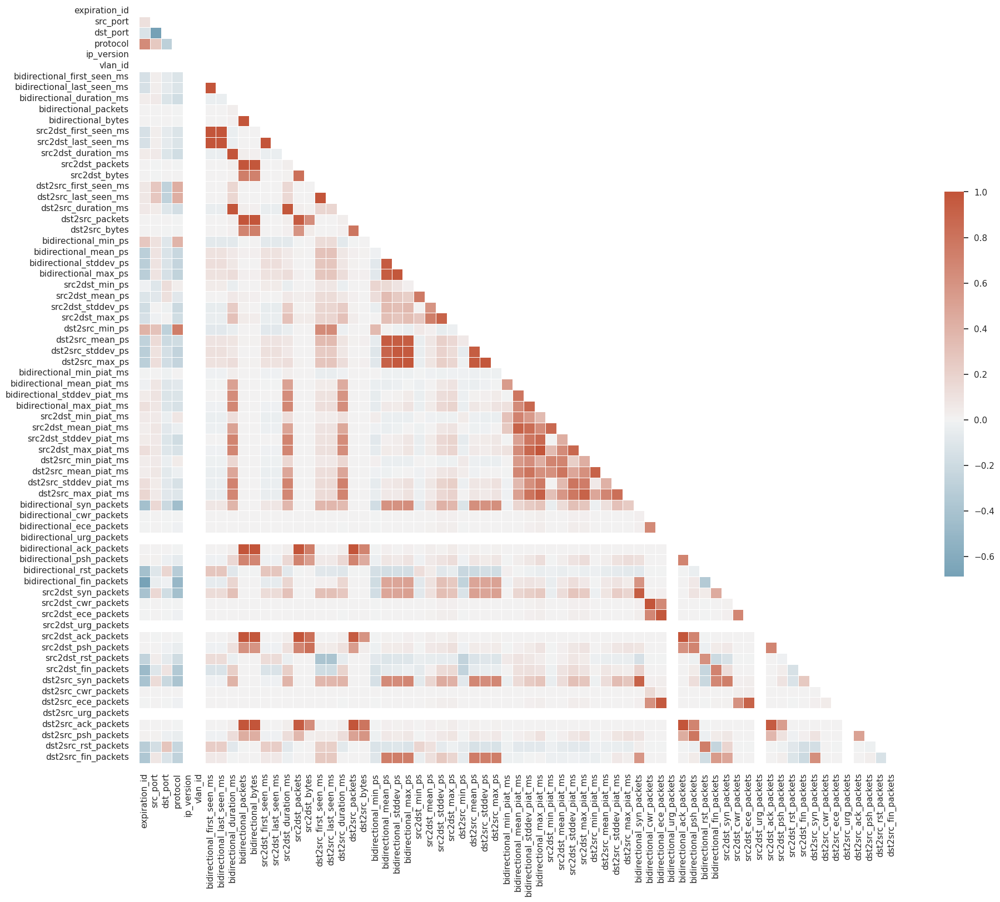

In [41]:
show_corr_matrix(ds)

In [42]:
compute_ratio(ds,'label')

                            Ratio
label                            
BENIGN                      83.71
PortScan                     7.34
DoS Hulk                     5.03
DDoS                         3.03
FTP-Patator                  0.25
DoS GoldenEye                0.25
DoS slowloris                0.16
SSH-Patator                  0.09
DoS Slowhttptest             0.09
Bot                          0.02
Web Attack - Brute Force     0.00
Infiltration                 0.00
Web Attack - XSS             0.00
Web Attack - Sql Injection   0.00
Heartbleed                   0.00


In [43]:
ds.label.value_counts()

label
BENIGN                        2639806
PortScan                       231572
DoS Hulk                       158546
DDoS                            95685
FTP-Patator                      7963
DoS GoldenEye                    7917
DoS slowloris                    5192
SSH-Patator                      2980
DoS Slowhttptest                 2732
Bot                               738
Web Attack - Brute Force          151
Infiltration                       28
Web Attack - XSS                   27
Web Attack - Sql Injection         12
Heartbleed                         11
Name: count, dtype: int64

In [44]:
ds = ds.drop(columns=feature_to_remove_NFS)

In [45]:
sample_weights = ds.label.value_counts().to_dict()

In [46]:
sample_weights['BENIGN'] = 738
sample_weights['PortScan'] = 738
sample_weights['DoS Hulk'] = 738
sample_weights['DDoS'] = 738
sample_weights['FTP-Patator'] = 738
sample_weights['DoS GoldenEye'] = 738
sample_weights['DoS slowloris'] = 738
sample_weights['SSH-Patator'] = 738
sample_weights['DoS Slowhttptest'] = 738

In [47]:
params = {
    "n_estimators": 4,
    "max_depth": 6,
    "booster": 'gbtree', 
    "objective": 'multi:softprob',
    "n_jobs": -1,
    "random_state": 12,
    "num_class": 15
}

bst = XGBClassifier(**params)

le = LabelEncoder()
le.fit(ds['label'])

rus = RandomUnderSampler(random_state=42, sampling_strategy=sample_weights)
X_res, y_res = rus.fit_resample(ds.drop(columns=['label']), ds['label'])
y_res = le.transform(y_res)

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size = 0.2, random_state=12, shuffle=True, stratify=y_res)

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)
Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel

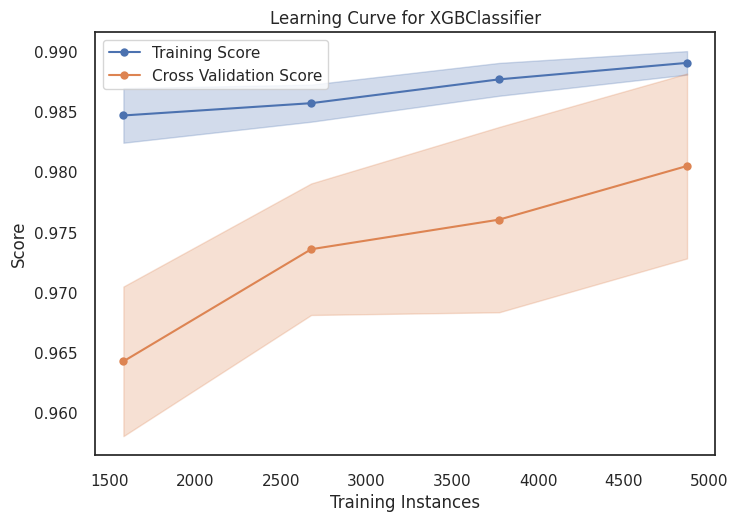

In [49]:
if True:
    cv = 5
    visualizer = LearningCurve(estimator=bst, cv=cv, scoring='f1_weighted', n_jobs=1, random_state=123)
    visualizer.fit(X_train, y_train)
    visualizer.show(outpath="bst_data/learning_curve.png")


![Alt text](bst_data/learning_curve.png)

In [50]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
skf.get_n_splits(X_res, y_res)

5

In [51]:
avg_train_f1 = []
avg_test_f1 = []

for i, (train_index, test_index) in enumerate(skf.split(X_res, y_res)):
    print(f"Fold {i}:")
    bst.fit(X_res.iloc[train_index], y_res[train_index])
    y_predicted_train = bst.predict(X_res.iloc[train_index])
    y_predicted_test = bst.predict(X_res.iloc[test_index])
    train_f1 = metrics.f1_score(y_res[train_index], y_predicted_train, average='weighted')
    test_f1 = metrics.f1_score(y_res[test_index], y_predicted_test, average='weighted')
    print(f"Train F1: {train_f1:.4f}")
    print(f"Test F1: {test_f1:.4f}")
    avg_train_f1.append(train_f1)
    avg_test_f1.append(test_f1)

print(f"Average Train F1: {np.mean(avg_train_f1):.4f}")
print(f"Average Test F1: {np.mean(avg_test_f1):.4f}")

Fold 0:


Train F1: 0.9886
Test F1: 0.9801
Fold 1:
Train F1: 0.9869
Test F1: 0.9922
Fold 2:
Train F1: 0.9893
Test F1: 0.9792
Fold 3:
Train F1: 0.9880
Test F1: 0.9730
Fold 4:
Train F1: 0.9870
Test F1: 0.9773
Average Train F1: 0.9880
Average Test F1: 0.9803


In [52]:
%time bst.fit(X_train, y_train)

CPU times: user 1.2 s, sys: 1.24 ms, total: 1.2 s
Wall time: 133 ms


XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=4, n_jobs=-1, num_class=15,
              num_parallel_tree=None, ...)

In [53]:
%time y_predicted_train = bst.predict(X_train)
%time y_predicted_test = bst.predict(X_test)

CPU times: user 46.7 ms, sys: 2.39 ms, total: 49.1 ms
Wall time: 13.8 ms
CPU times: user 92.1 ms, sys: 0 ns, total: 92.1 ms
Wall time: 10.9 ms


In [54]:
performanceMetricsDFWeighted(metrics, y_train, y_predicted_train, y_test, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.988336,0.977661
1,PRECISION,0.988419,0.976988
2,RECALL,0.988336,0.977661
3,F1 SCORE,0.988277,0.976940


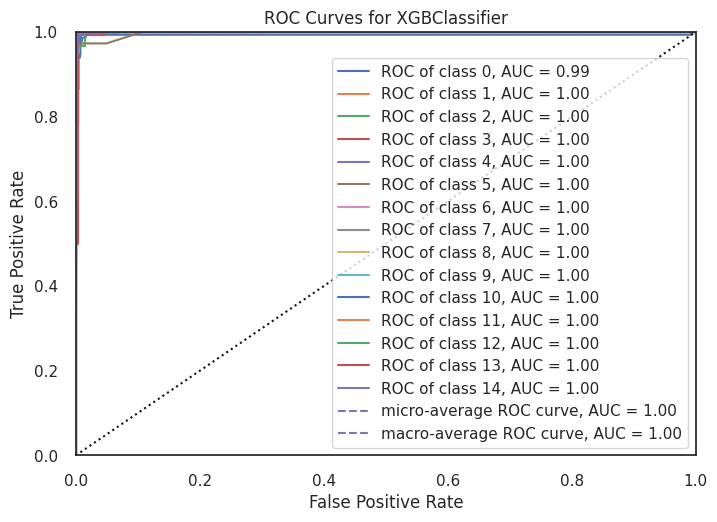

<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [55]:
model = wrap(bst)
visualizer = ROCAUC(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

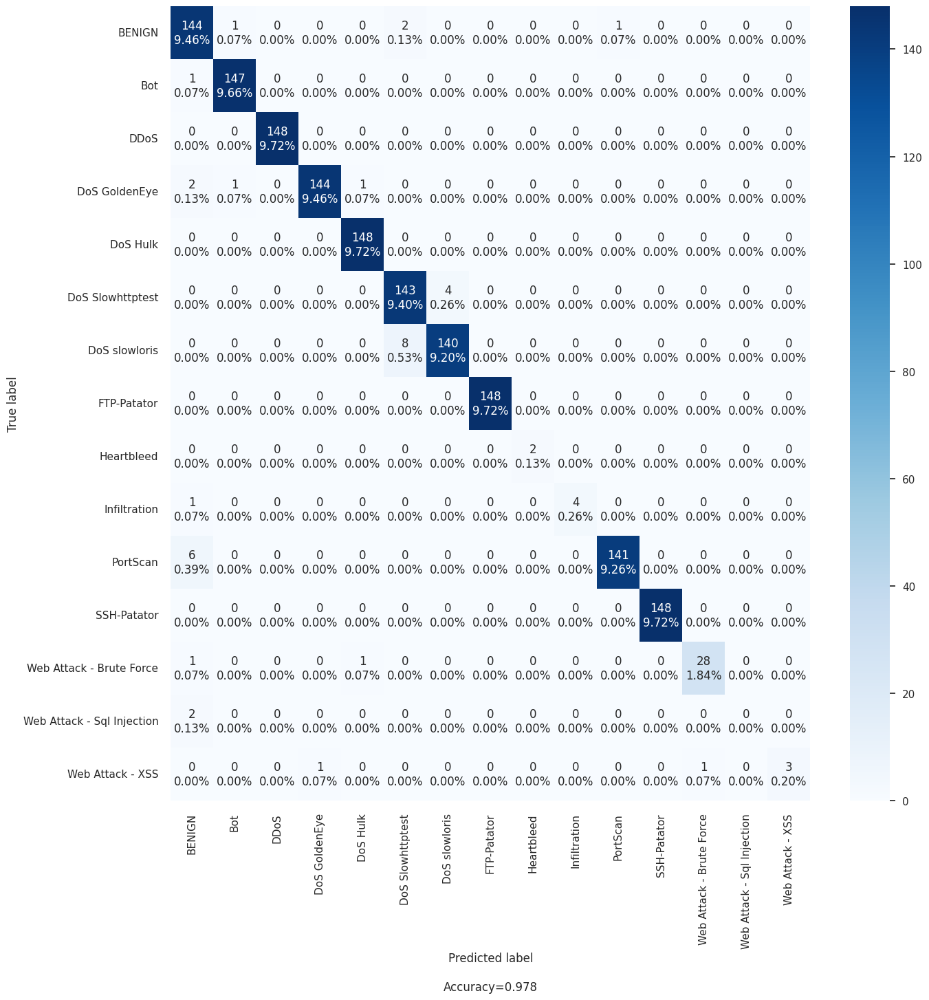

In [56]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test,y_predicted_test)
categories = pd.unique(le.classes_)
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [57]:
import xgboost as xgb

for tree_num in range(0,6):
    tree_viz = xgb.to_graphviz(bst, num_trees=0, rankdir='LR')
    tree_viz.render(f"bst_data/tree_{tree_num}")

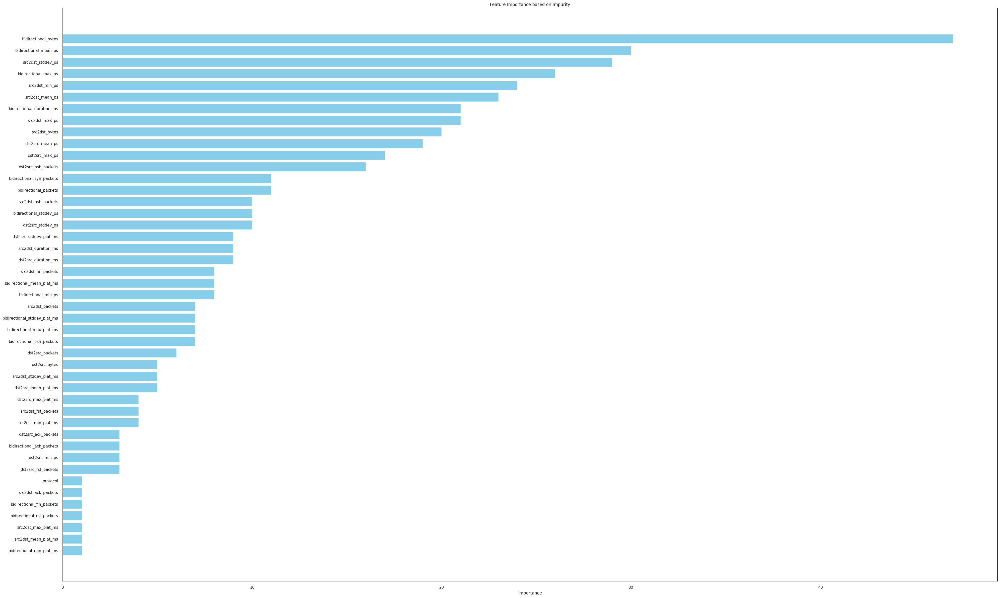

In [58]:
# Get feature importance based on impurity
impurity_importance = bst.get_booster().get_score(importance_type='weight')

# Convert the dictionary to a DataFrame
feature_importance_df = pd.DataFrame(list(impurity_importance.items()), columns=['Feature', 'Importance'])

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Reset index
feature_importance_df.reset_index(drop=True, inplace=True)

# Plotting feature importance
plt.figure(figsize=(40, 24))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importance based on Impurity')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.tight_layout()
plt.show()

Using interventional to stay "true to the model" since we will use this data to do feature reduction and we want also to understand how things work

In [59]:
%%time

explainer = fasttreeshap.TreeExplainer(bst, X_train, algorithm='auto', n_jobs=-1, feature_perturbation="interventional")
sv = explainer(X_train)

[20:02:11] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
 99%|===================| 90747/91305 [01:13<00:00]        

CPU times: user 1min 12s, sys: 304 ms, total: 1min 12s
Wall time: 1min 13s


In [60]:
le.classes_

array(['BENIGN', 'Bot', 'DDoS', 'DoS GoldenEye', 'DoS Hulk',
       'DoS Slowhttptest', 'DoS slowloris', 'FTP-Patator', 'Heartbleed',
       'Infiltration', 'PortScan', 'SSH-Patator',
       'Web Attack - Brute Force', 'Web Attack - Sql Injection',
       'Web Attack - XSS'], dtype=object)

## Benign shap

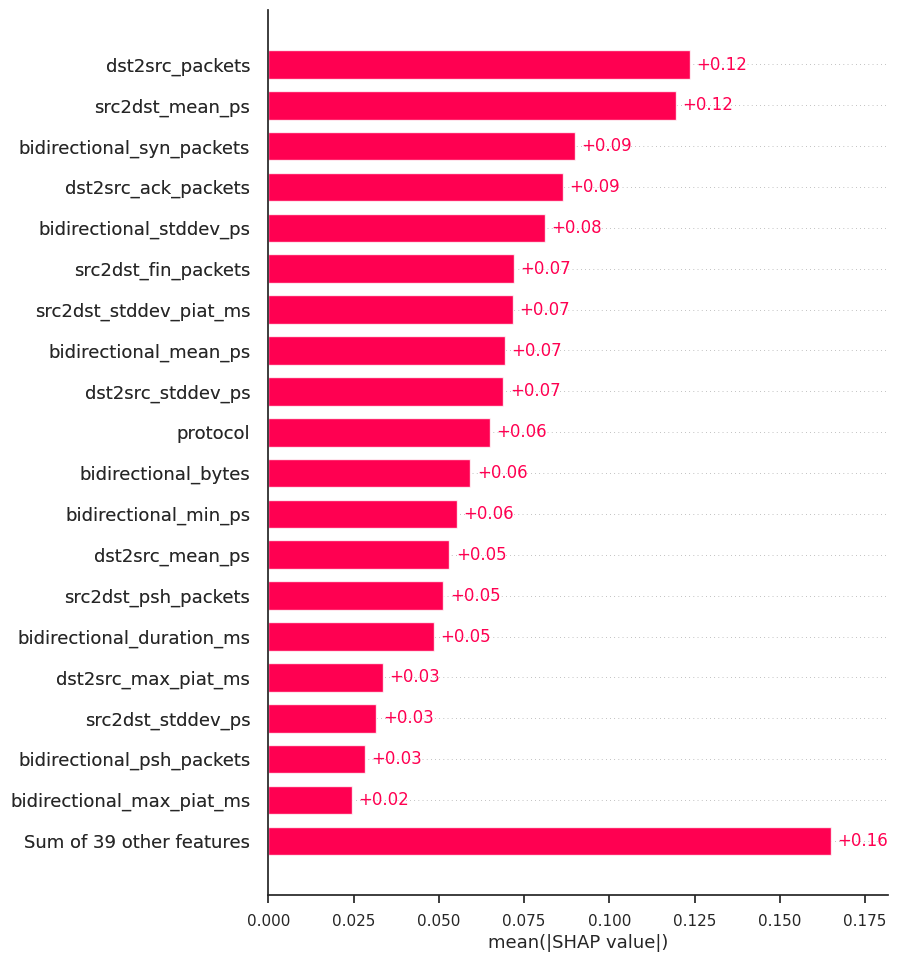

In [61]:
exp = Explanation(sv.values[:,:,0], 
                  sv.base_values[:,0], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

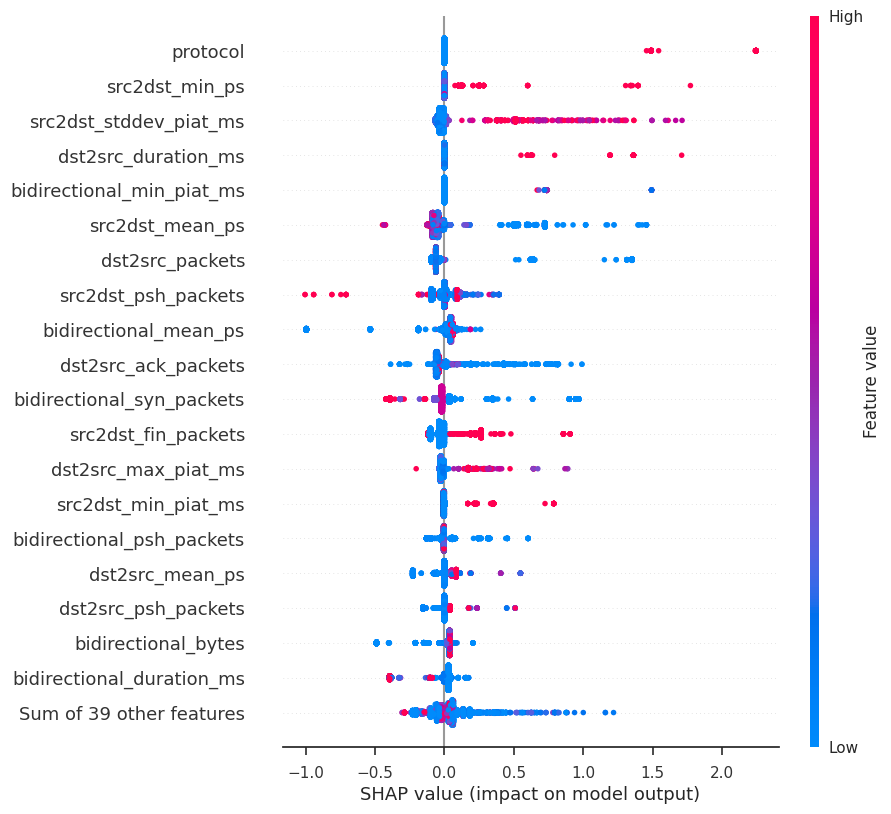

In [62]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

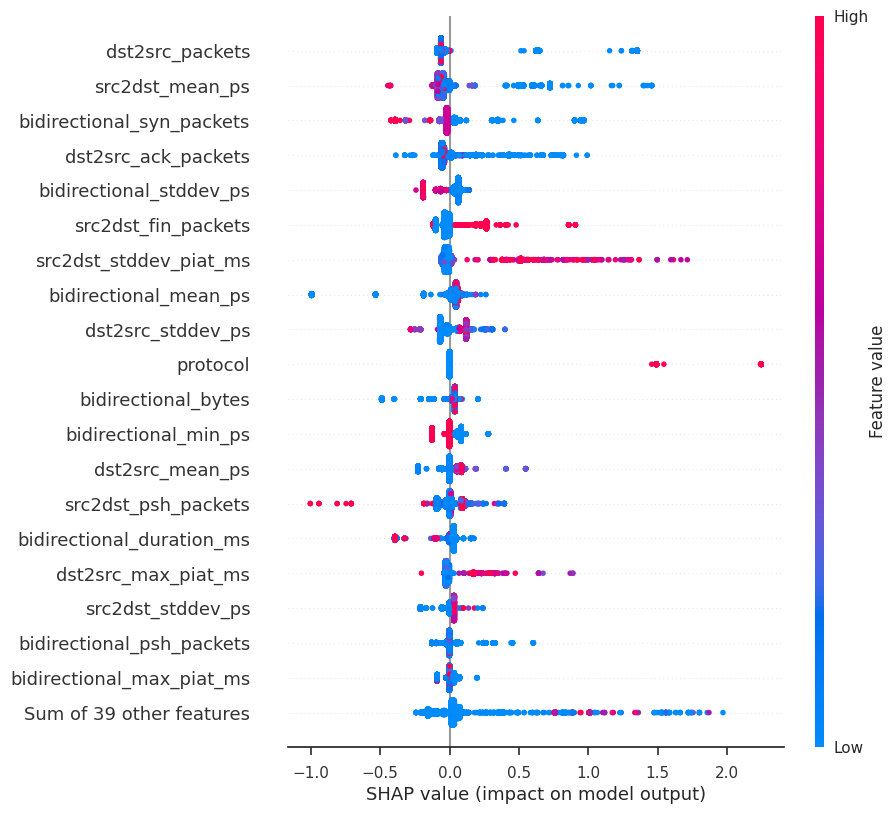

In [63]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Bot shap

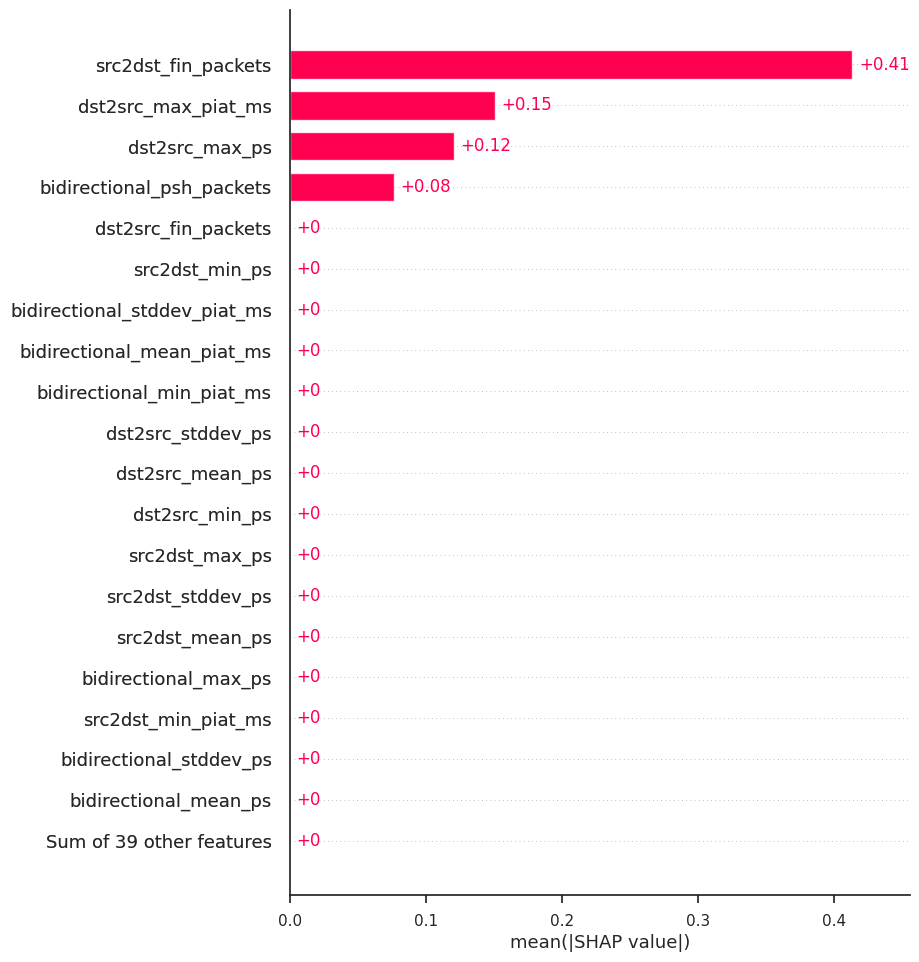

In [64]:
exp = Explanation(sv.values[:,:,1], 
                  sv.base_values[:,1], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

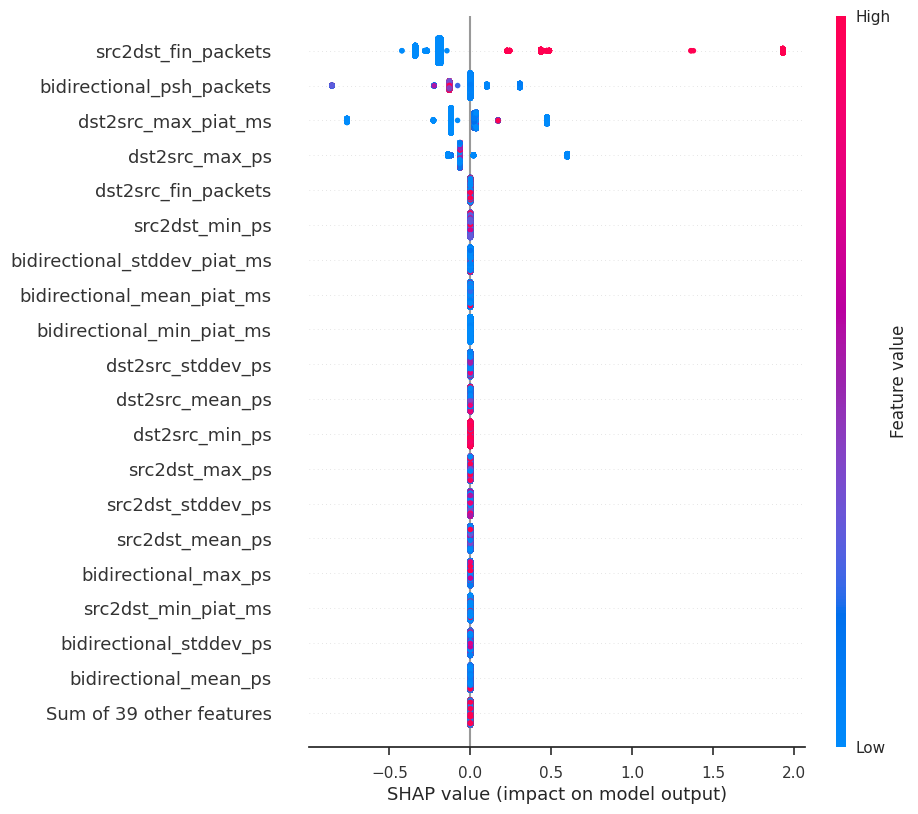

In [65]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

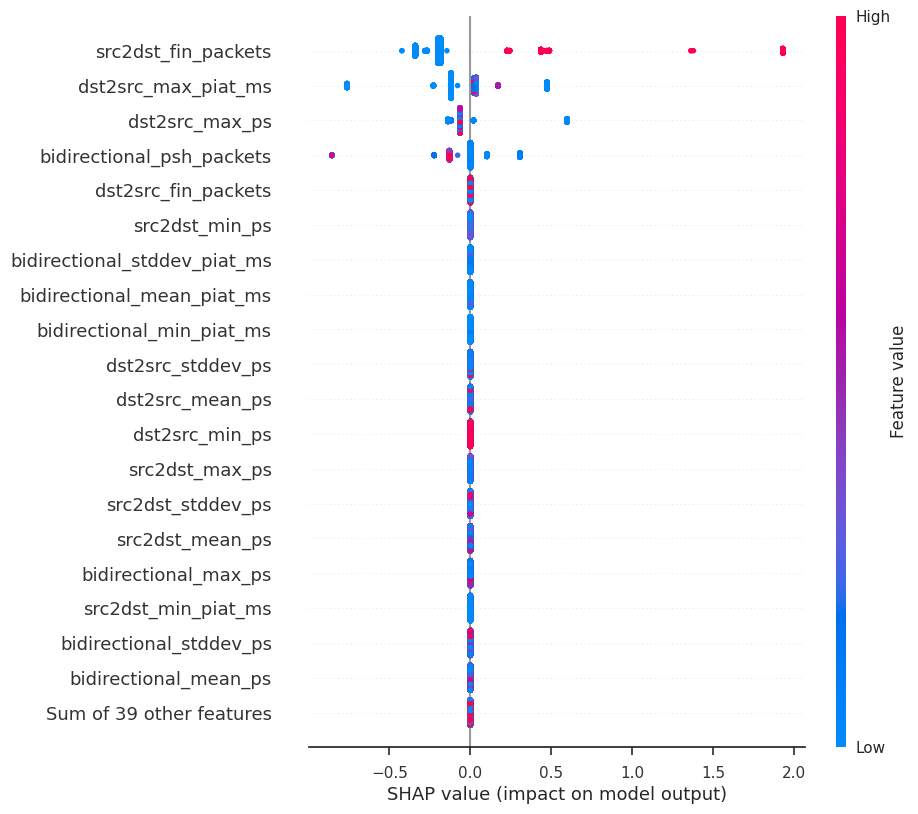

In [66]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DDoS shap

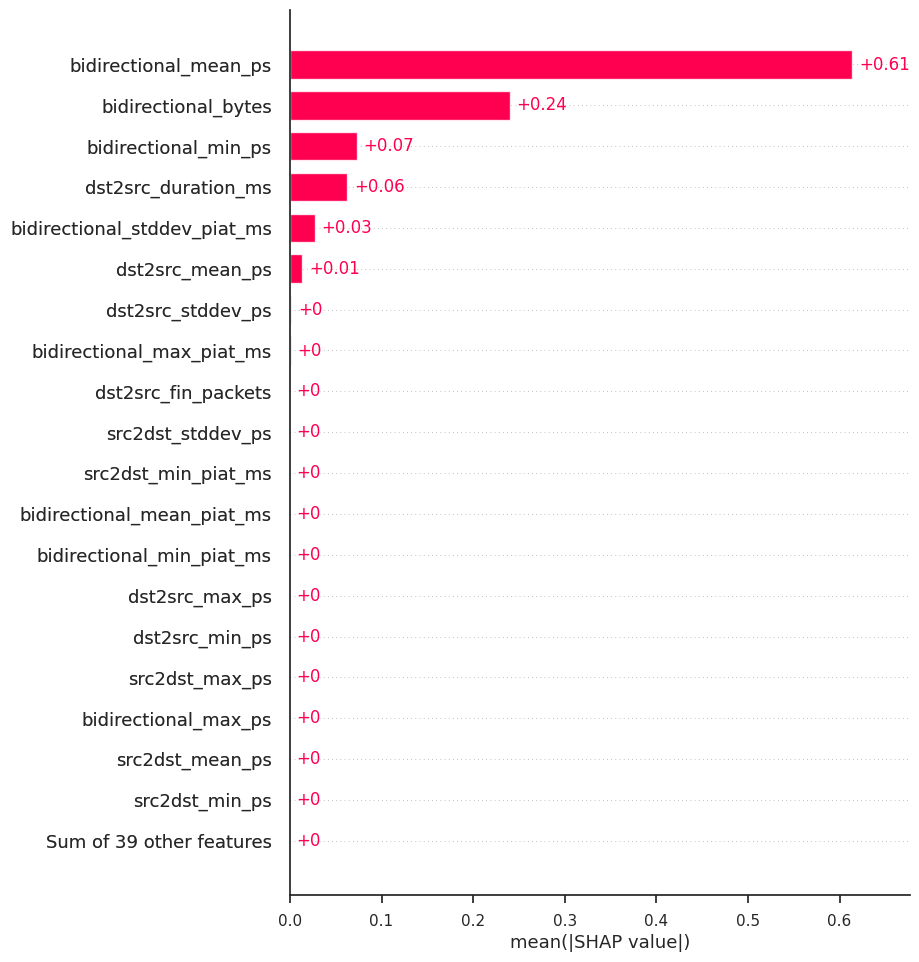

In [67]:
exp = Explanation(sv.values[:,:,2], 
                  sv.base_values[:,2], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)

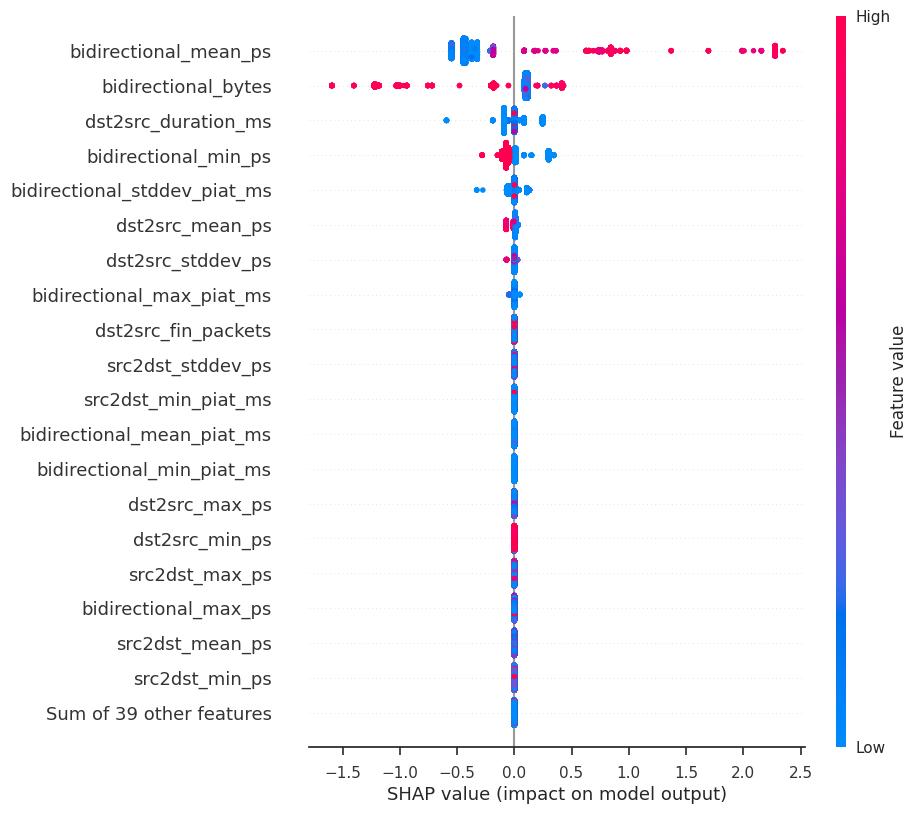

In [68]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

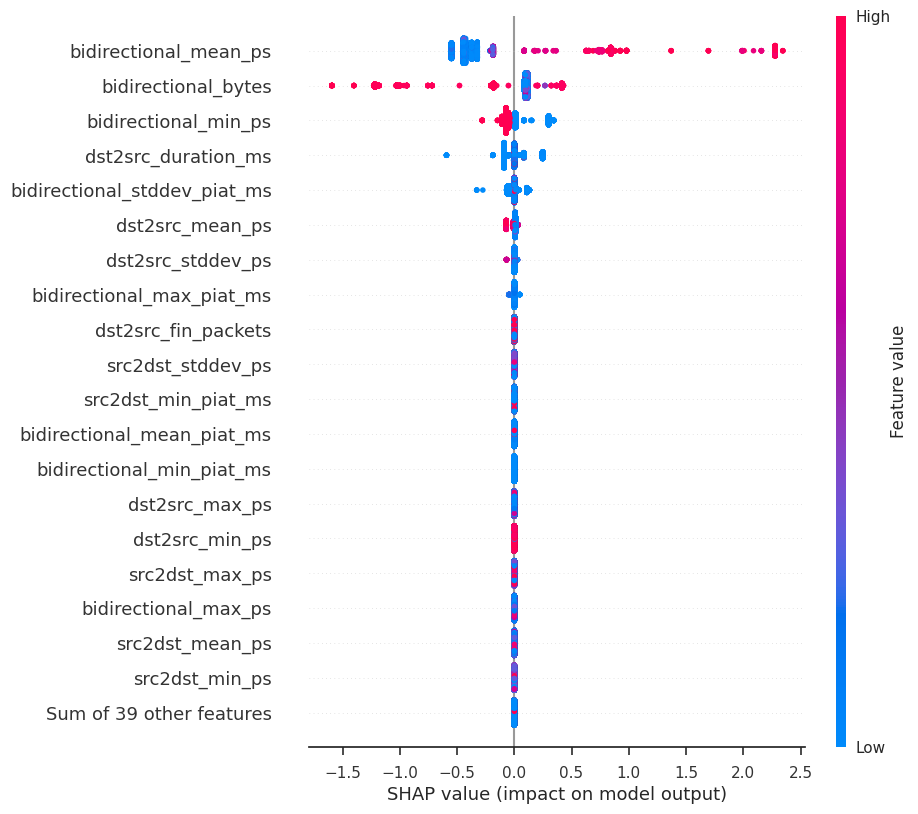

In [69]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS GoldenEye shap

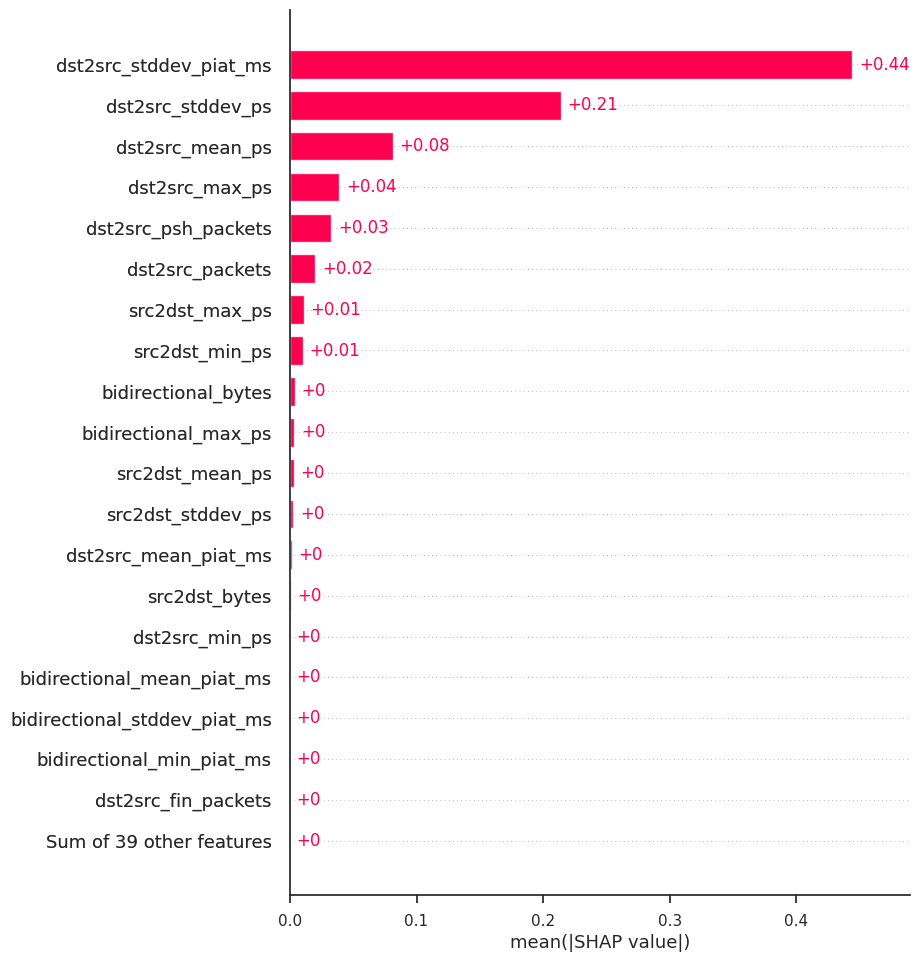

In [70]:
exp = Explanation(sv.values[:,:,3], 
                  sv.base_values[:,3], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

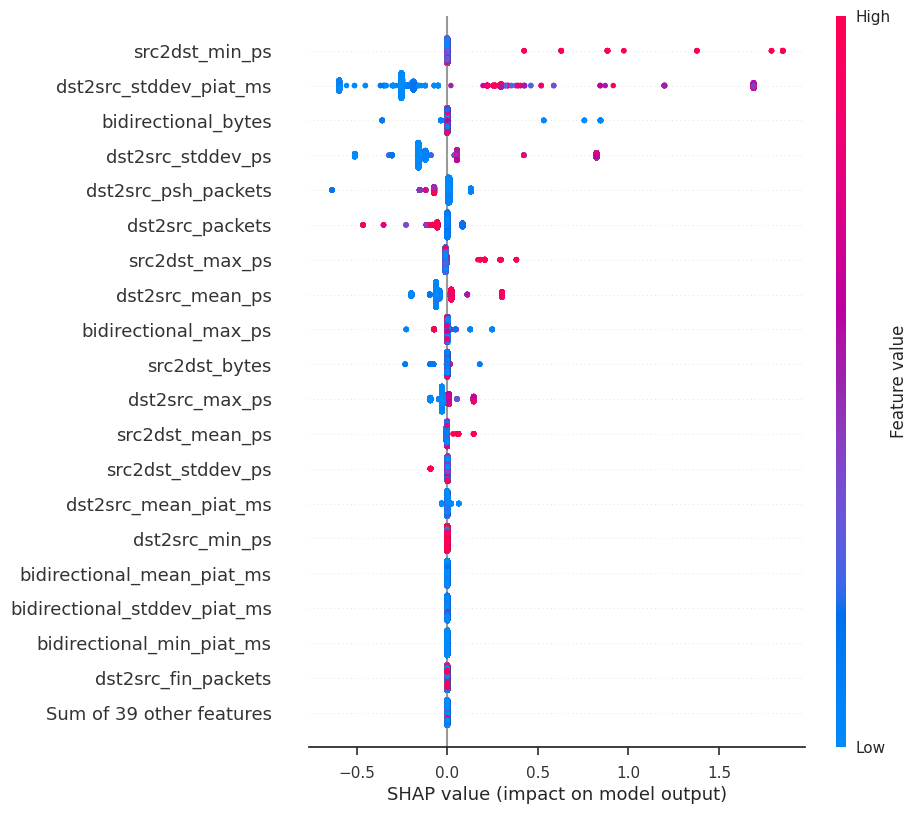

In [71]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

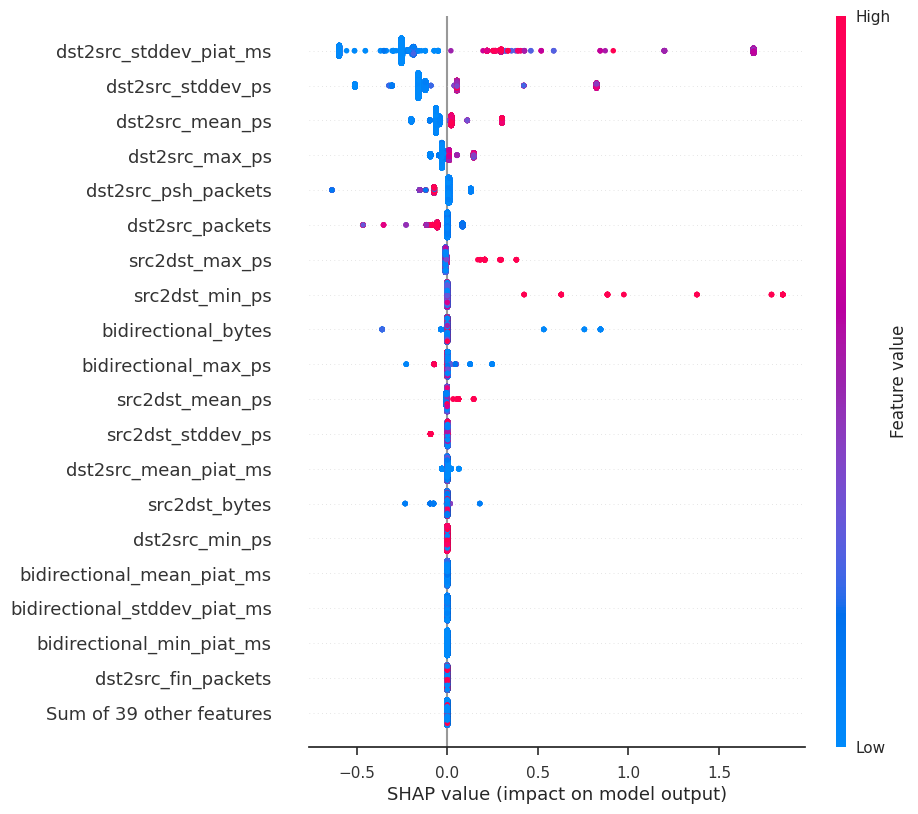

In [72]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Hulk shap

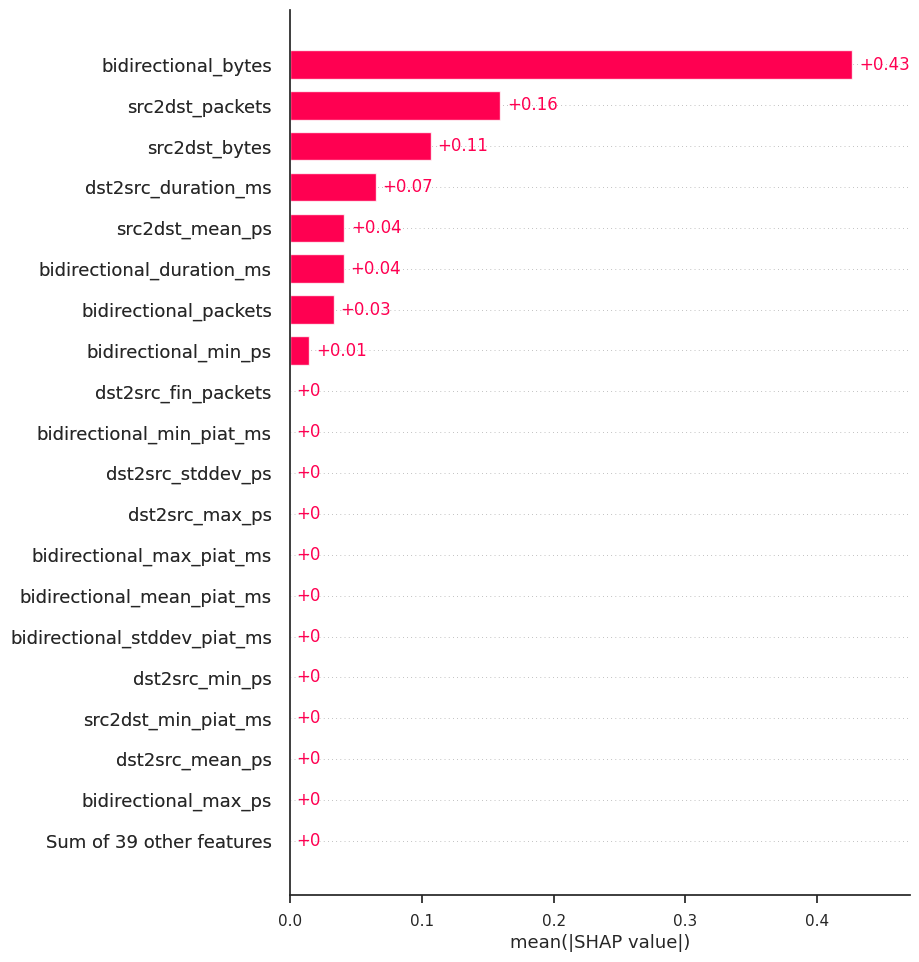

In [73]:
exp = Explanation(sv.values[:,:,4], 
                  sv.base_values[:,4], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

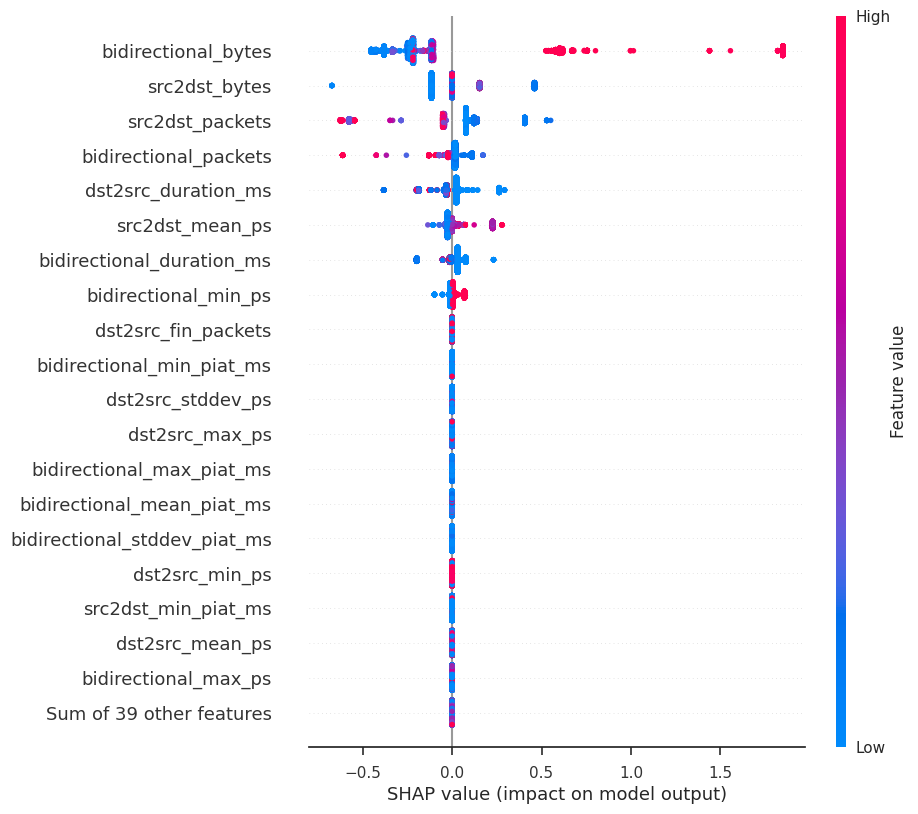

In [74]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

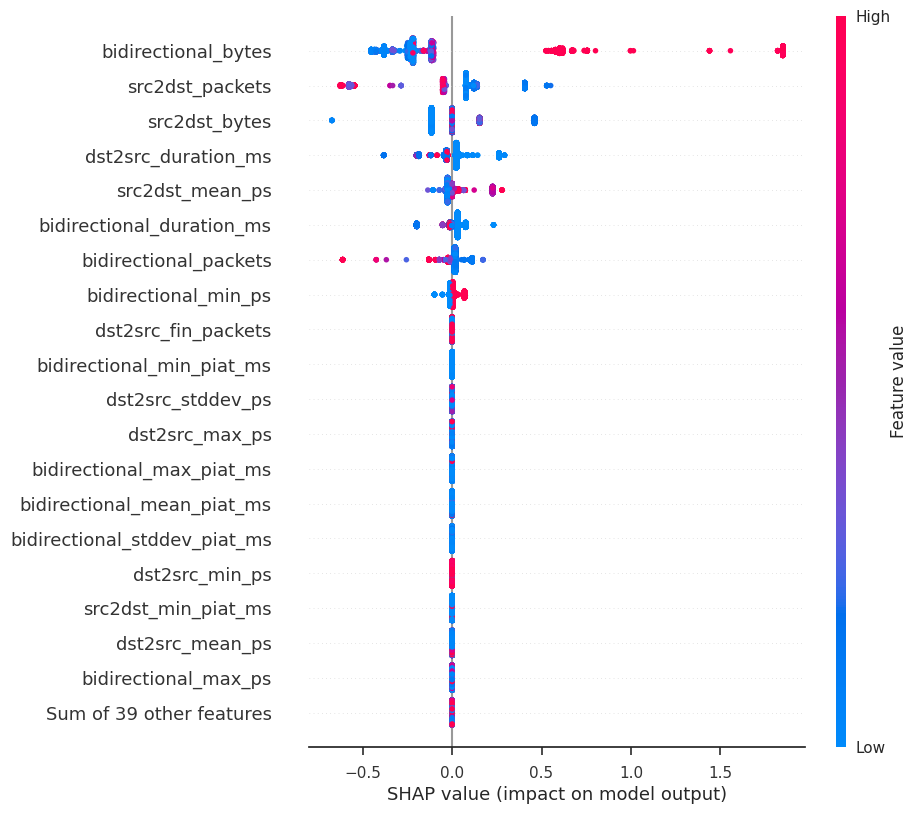

In [75]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS Slowhttptest shap

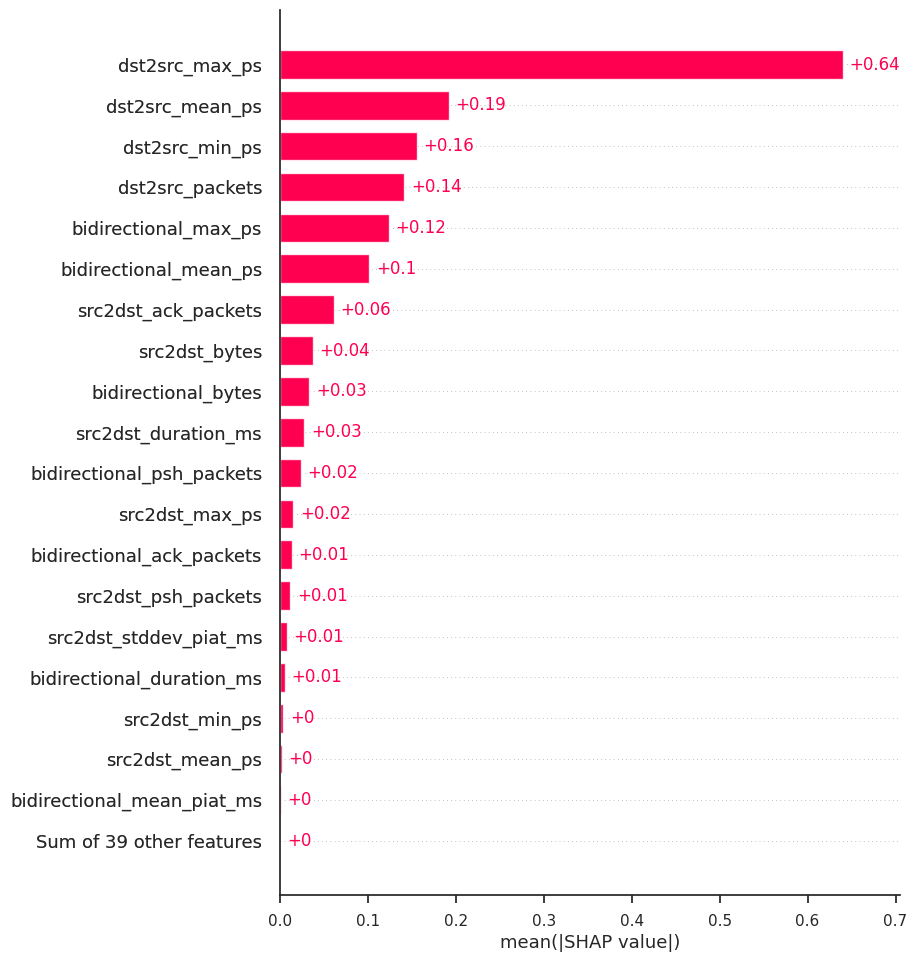

In [76]:
exp = Explanation(sv.values[:,:,5], 
                  sv.base_values[:,5], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

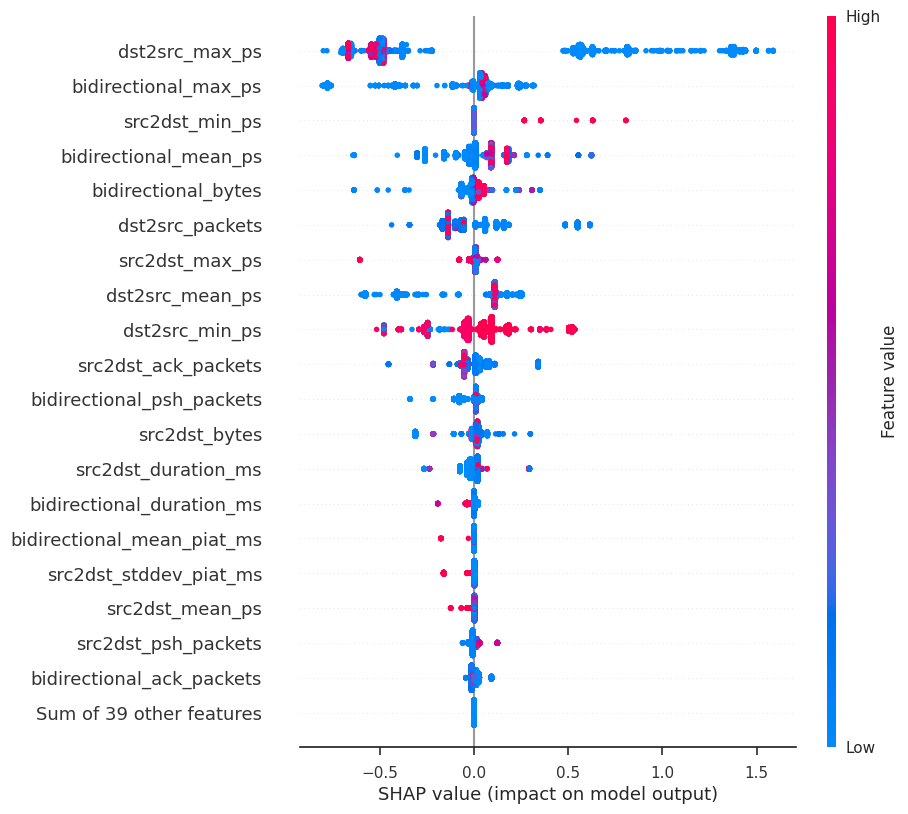

In [77]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

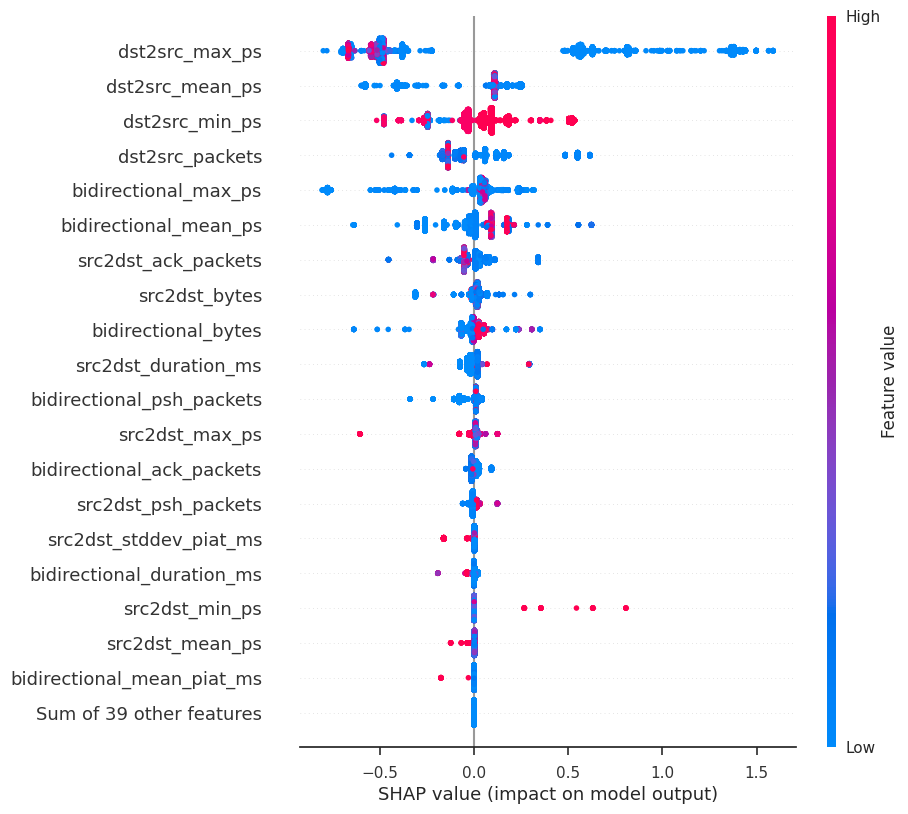

In [78]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## DoS slowloris shap

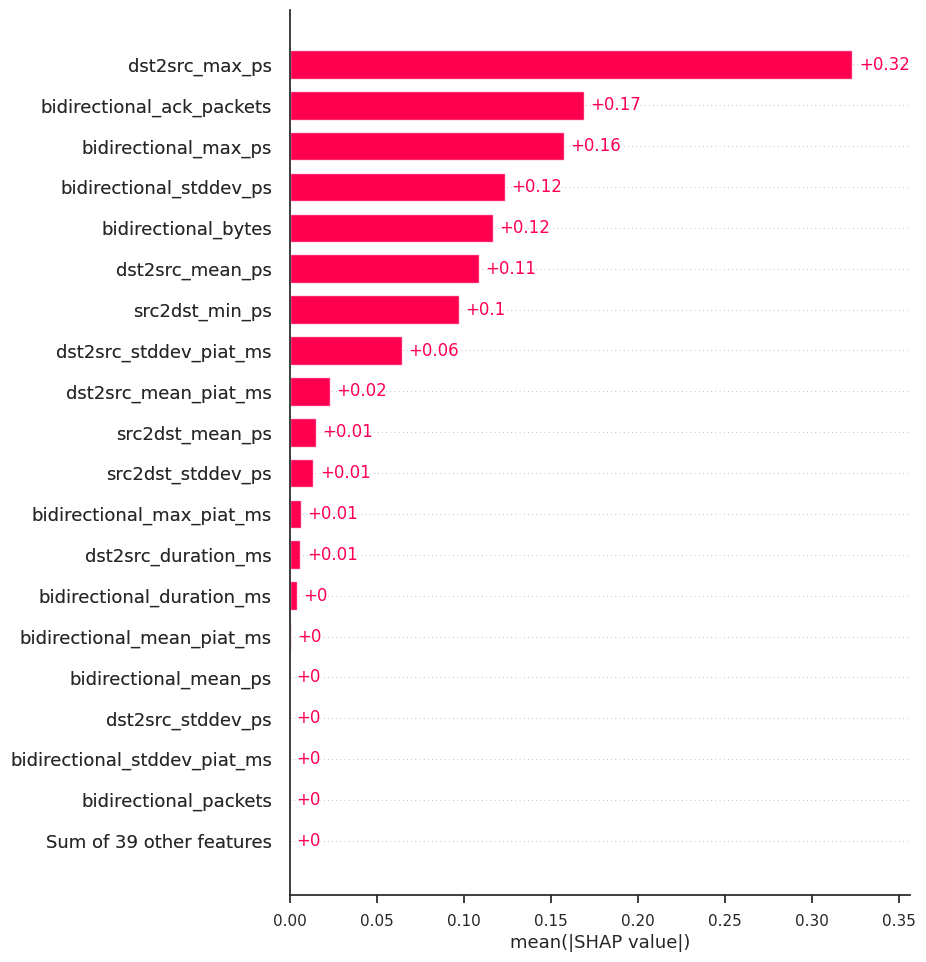

In [79]:
exp = Explanation(sv.values[:,:,6], 
                  sv.base_values[:,6], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

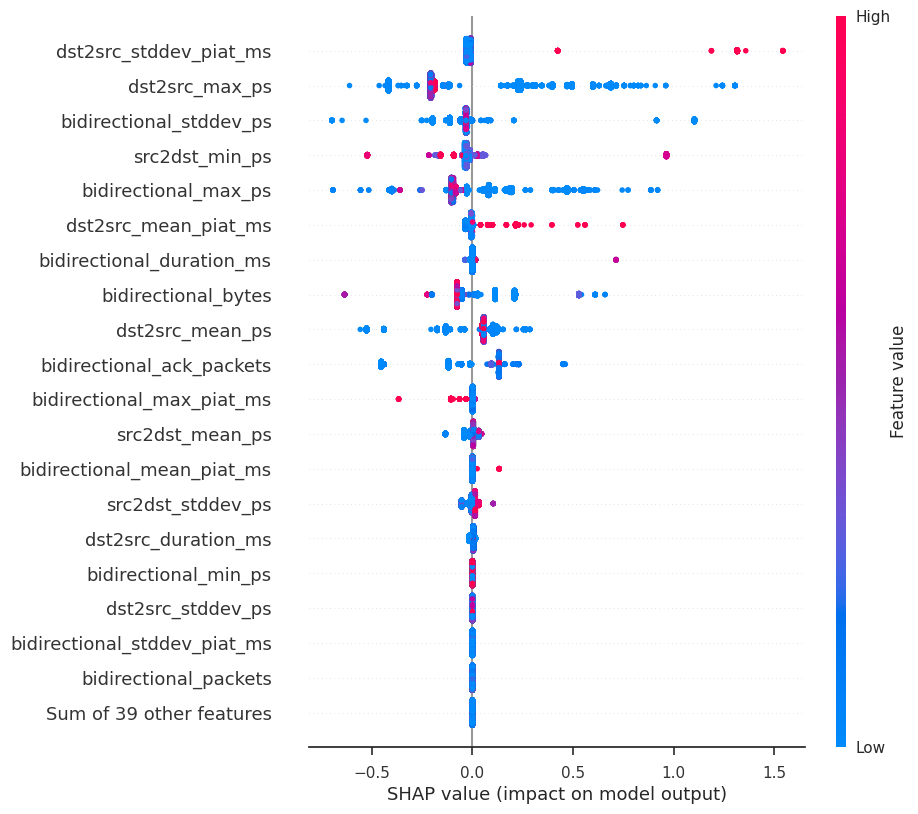

In [80]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

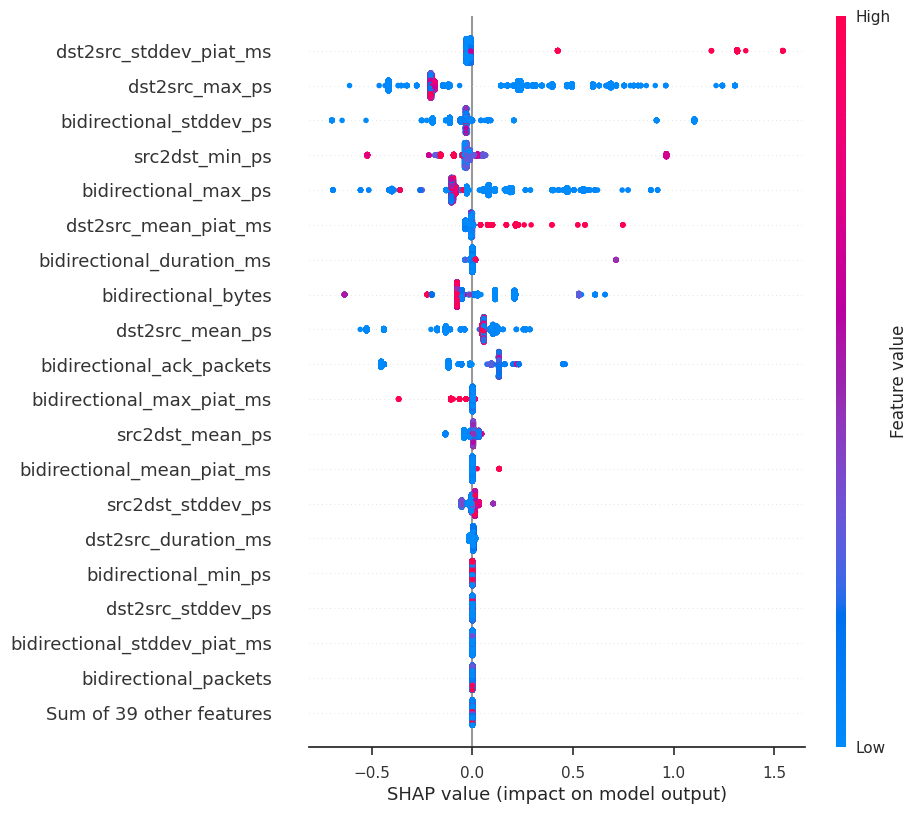

In [81]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

## FTP-Patator shap

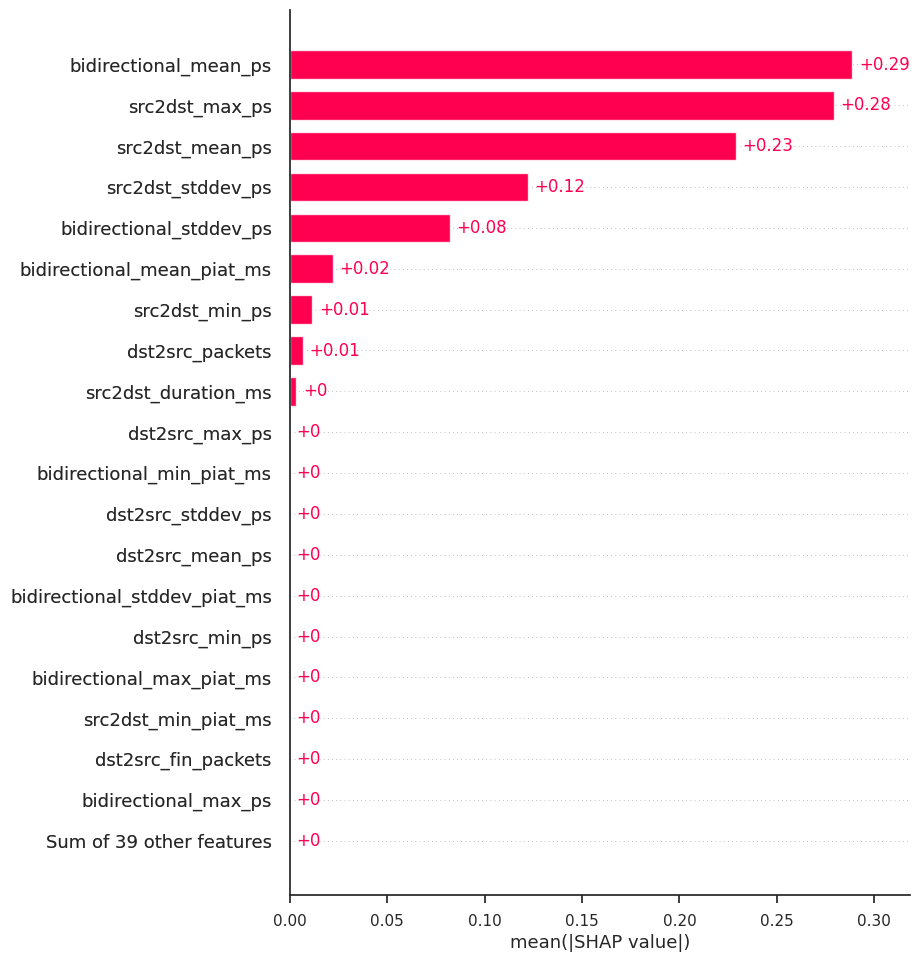

In [82]:
exp = Explanation(sv.values[:,:,7], 
                  sv.base_values[:,7], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

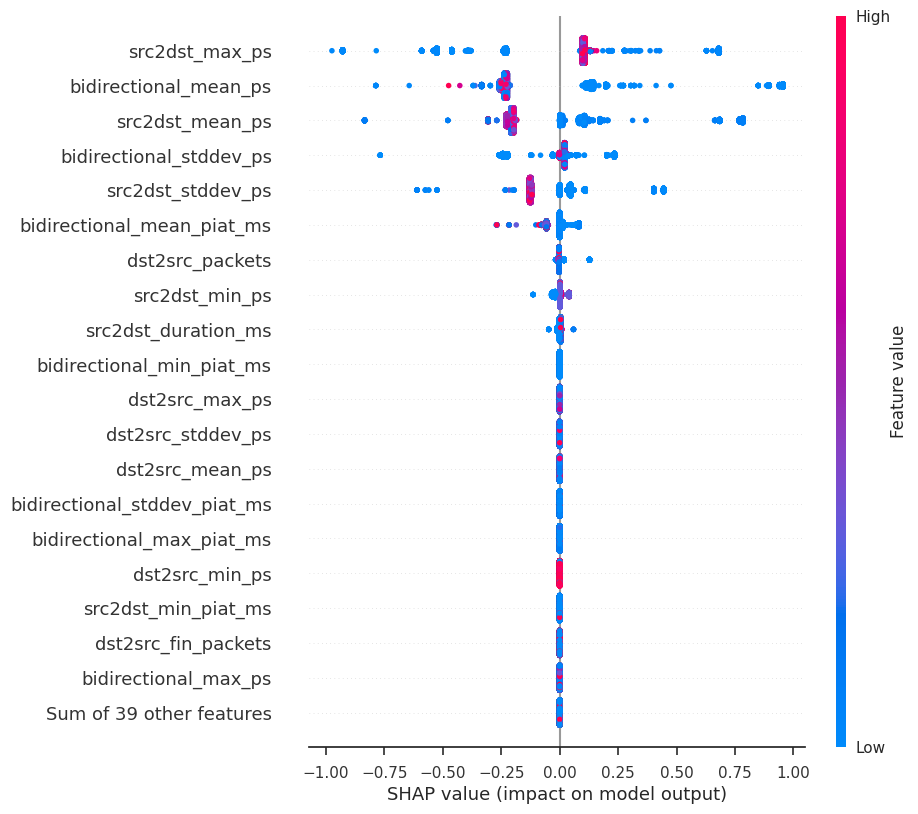

In [83]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

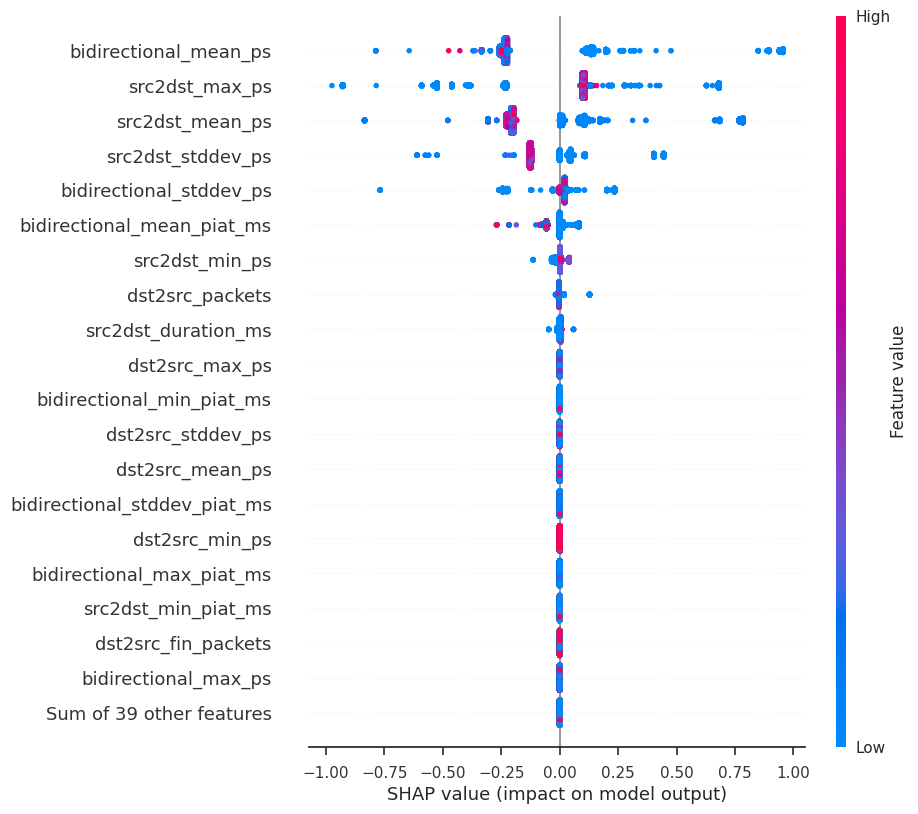

In [84]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Heartbleed shap

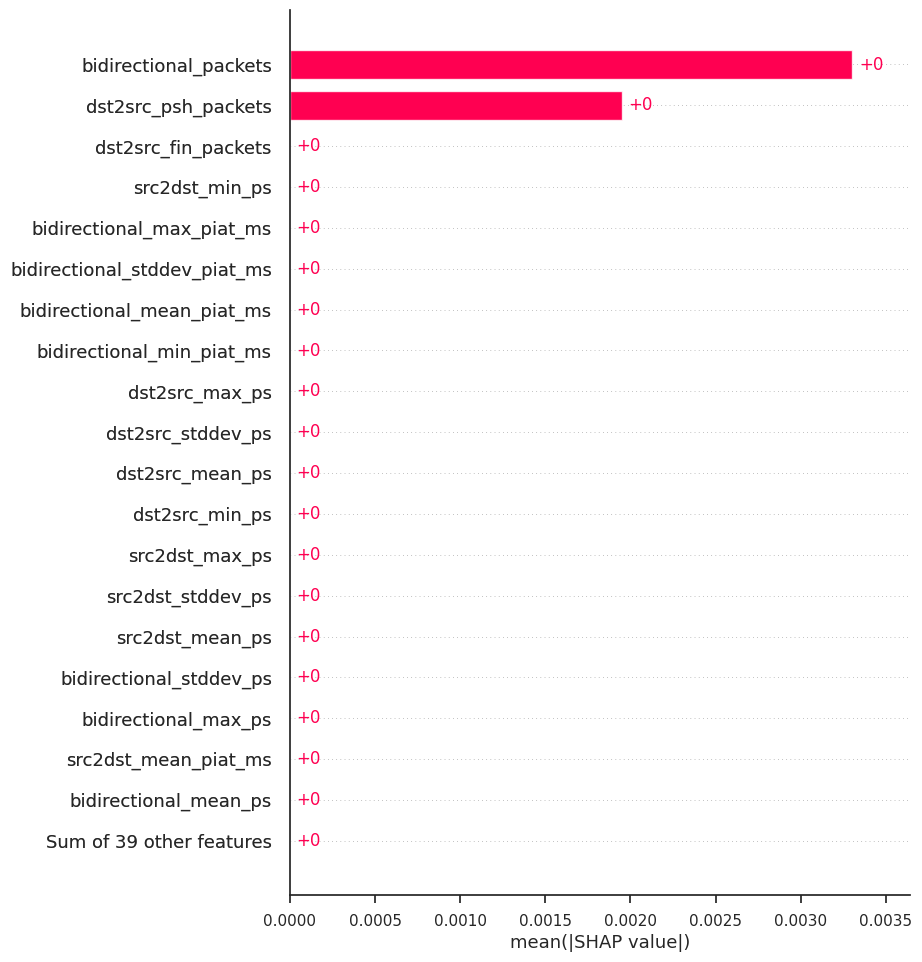

In [85]:
exp = Explanation(sv.values[:,:,8], 
                  sv.base_values[:,8], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

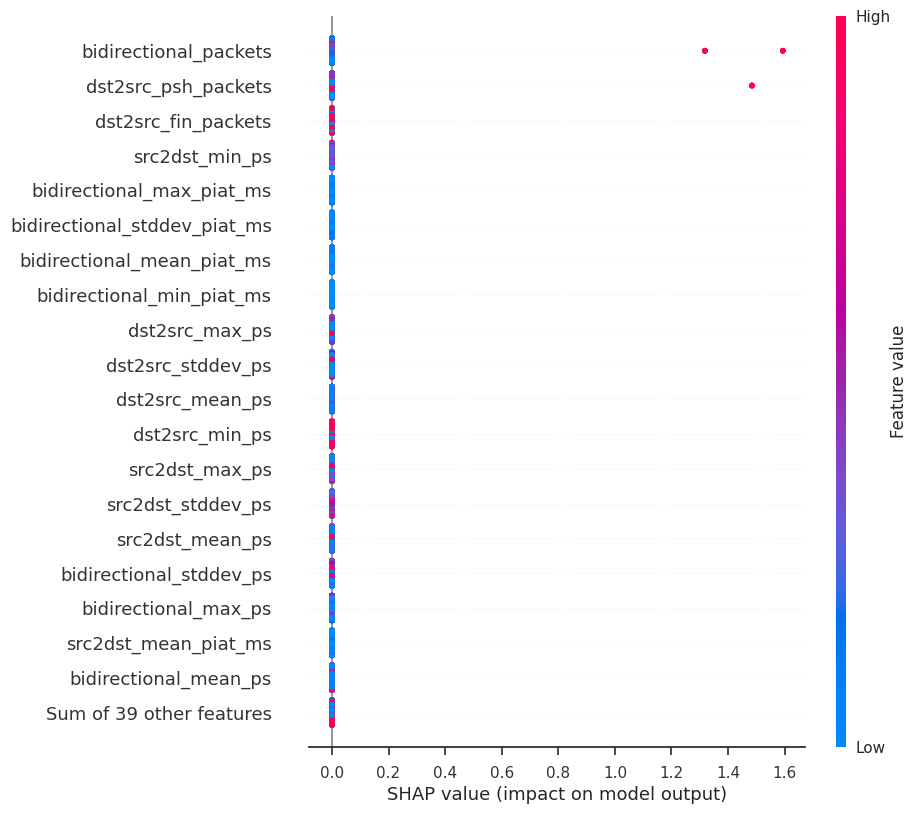

In [86]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

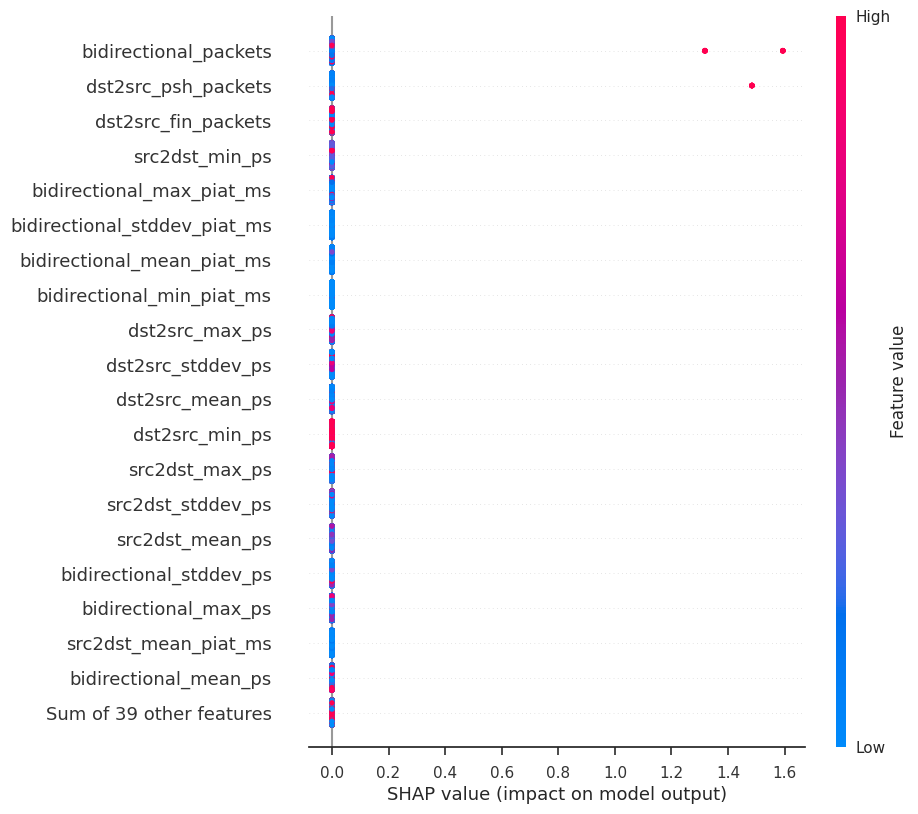

In [87]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Infiltration shap

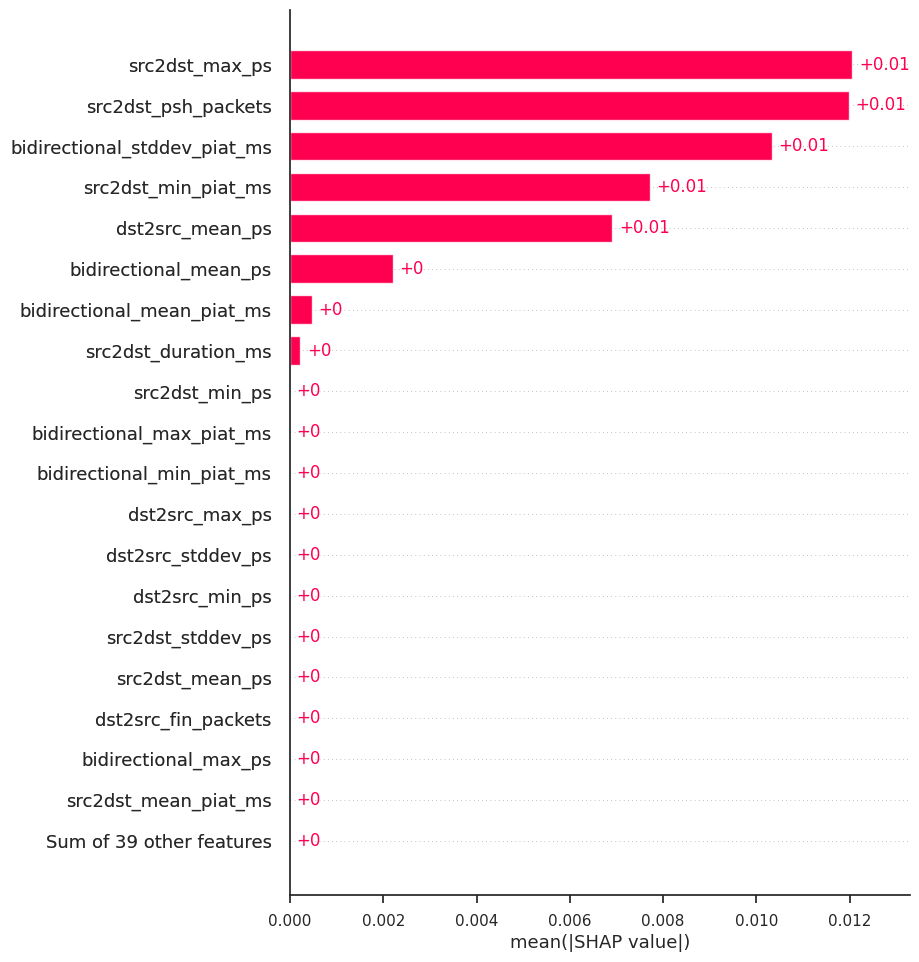

In [88]:
exp = Explanation(sv.values[:,:,9], 
                  sv.base_values[:,9], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

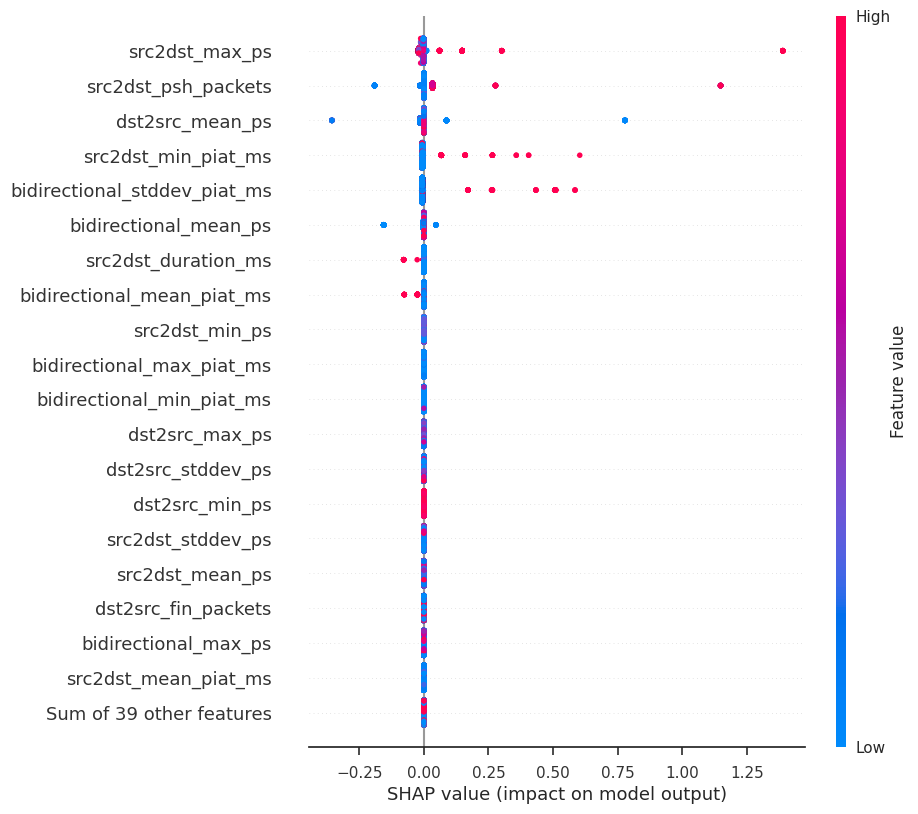

In [89]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

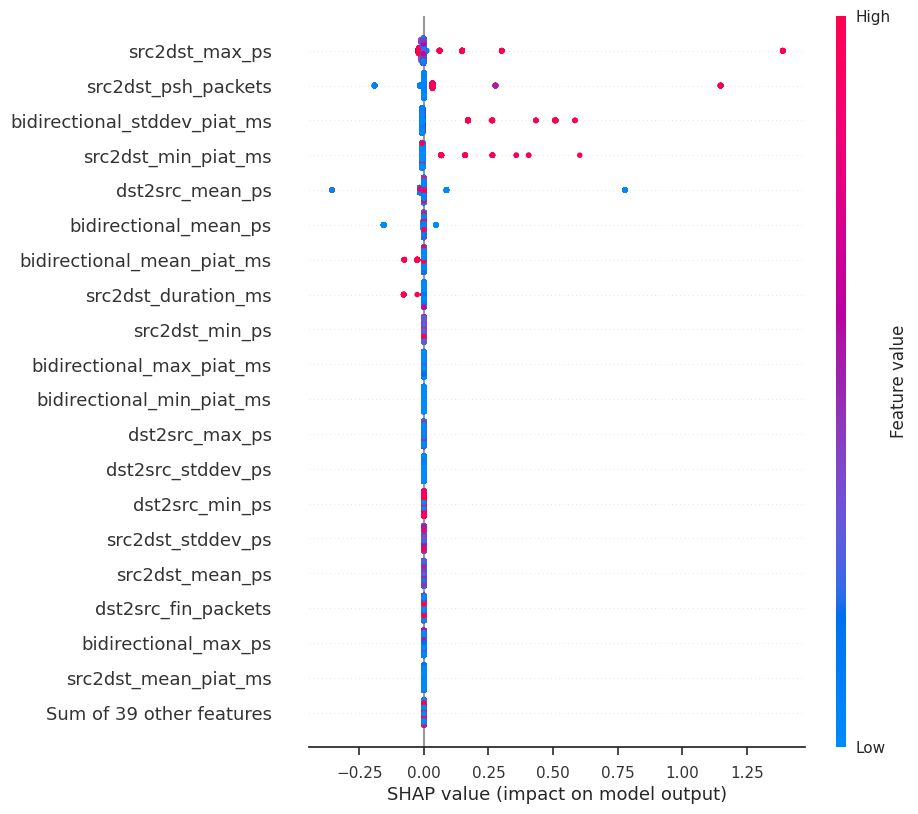

In [90]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## PortScan shap

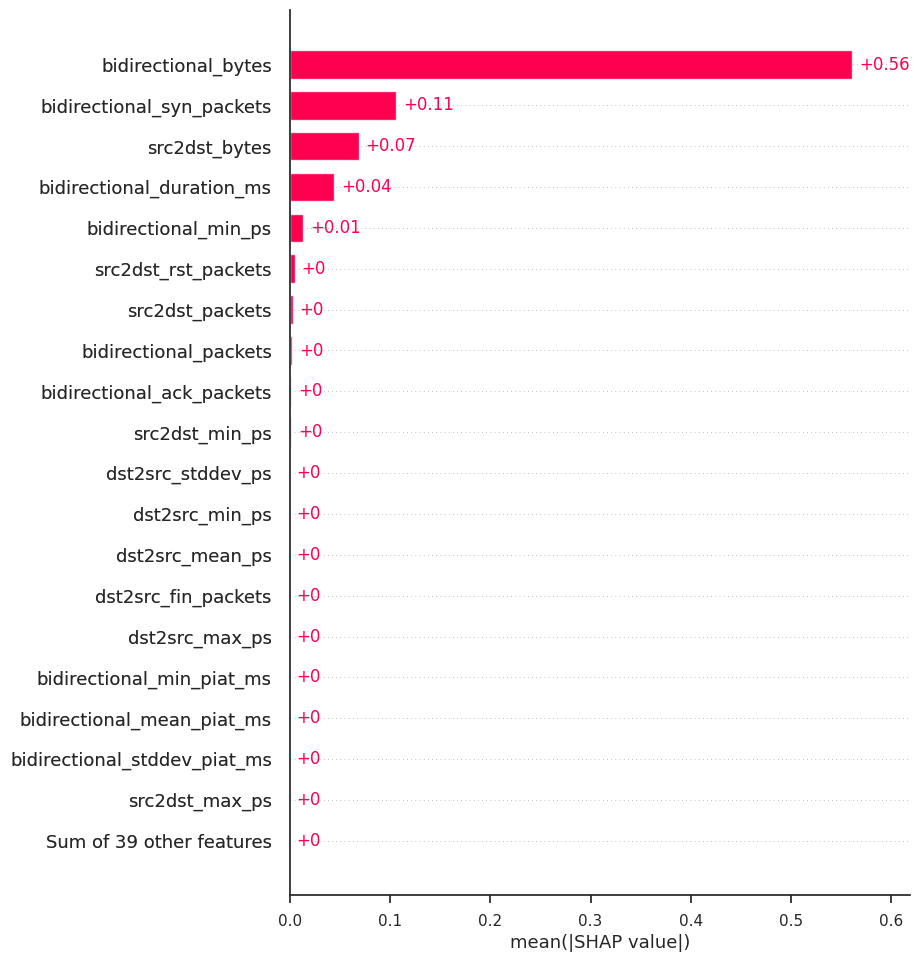

In [91]:
exp = Explanation(sv.values[:,:,10], 
                  sv.base_values[:,10], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

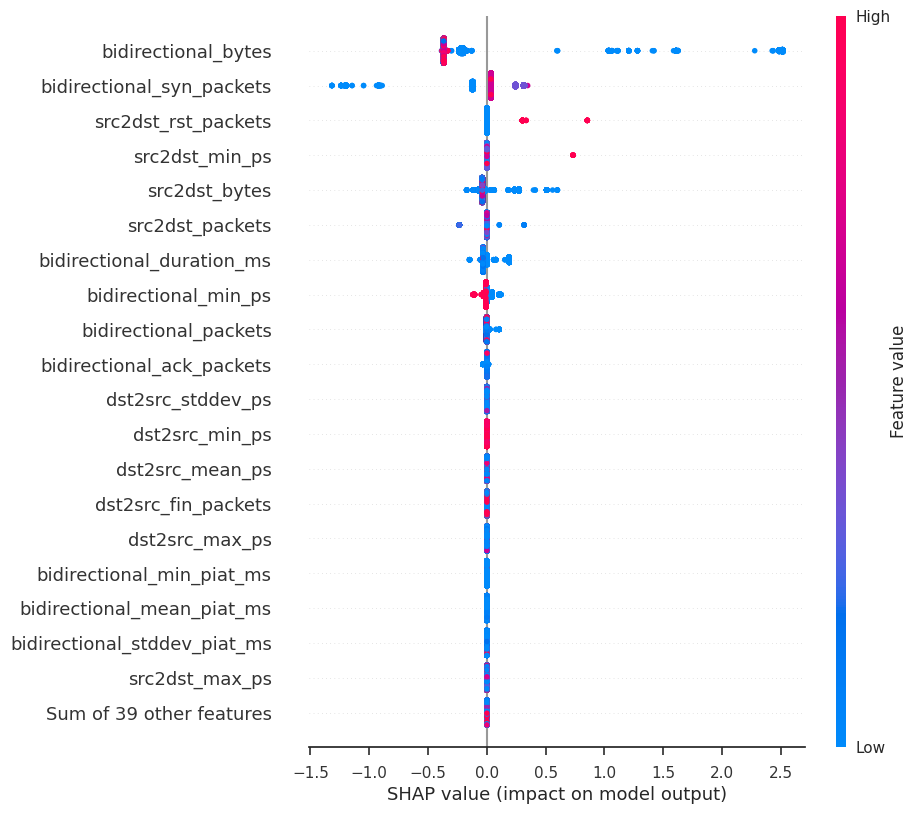

In [92]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

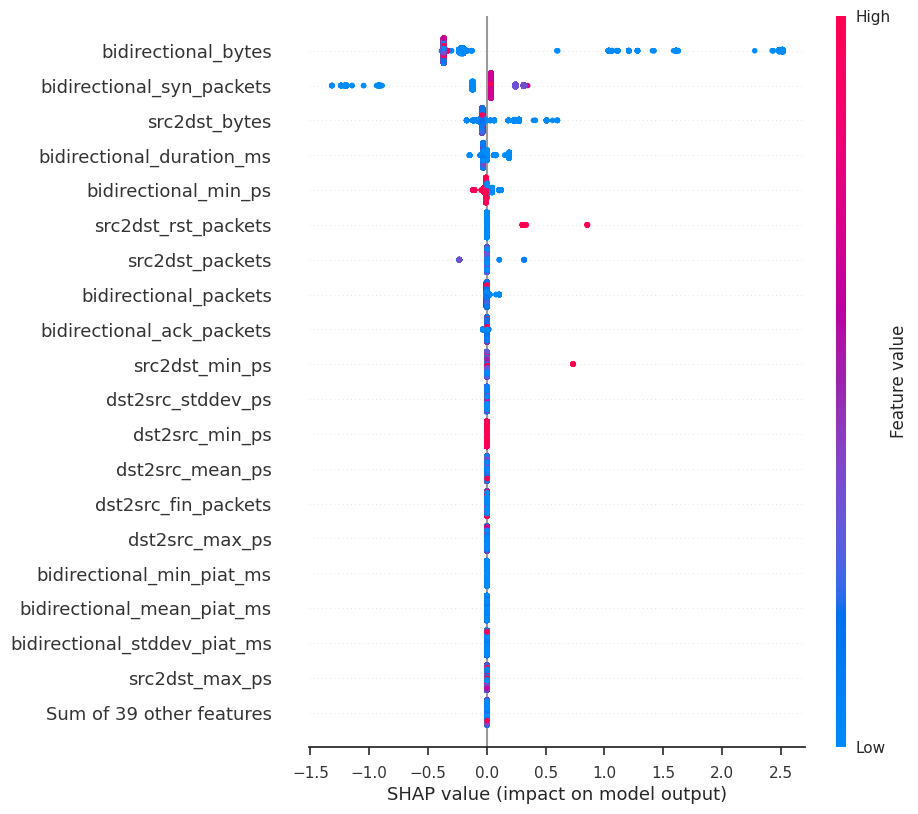

In [93]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## SSH-Patator shap

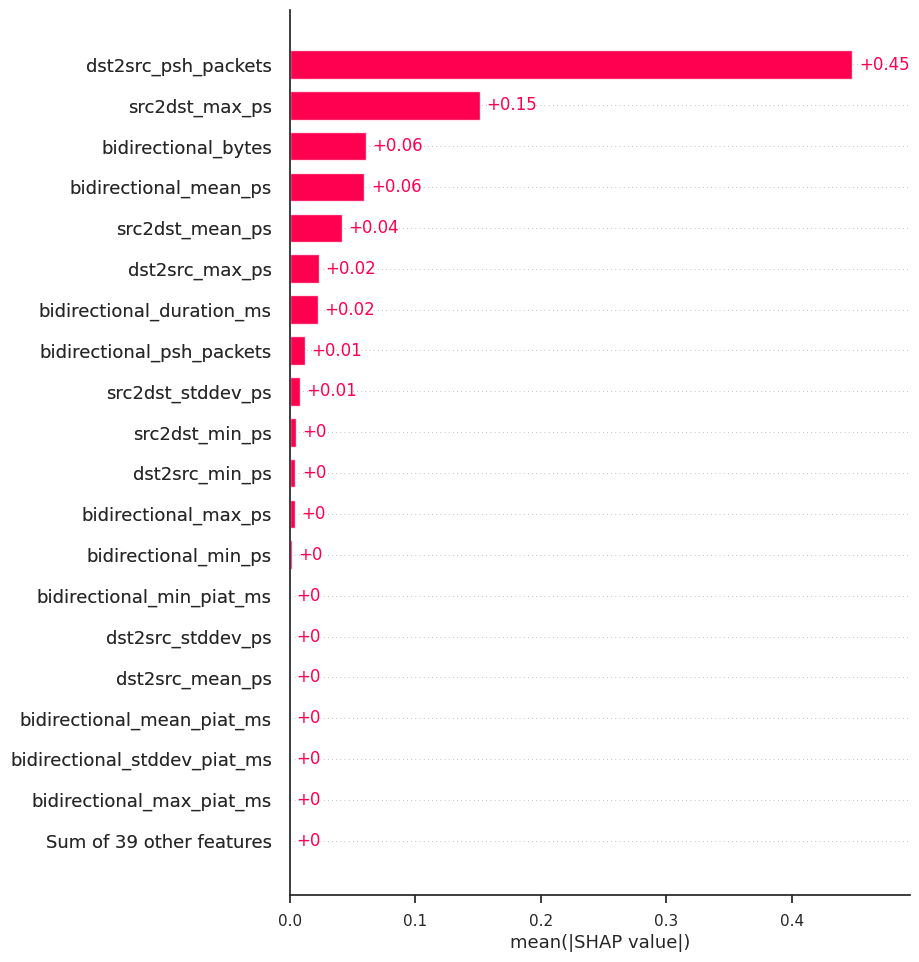

In [94]:
exp = Explanation(sv.values[:,:,11], 
                  sv.base_values[:,11], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

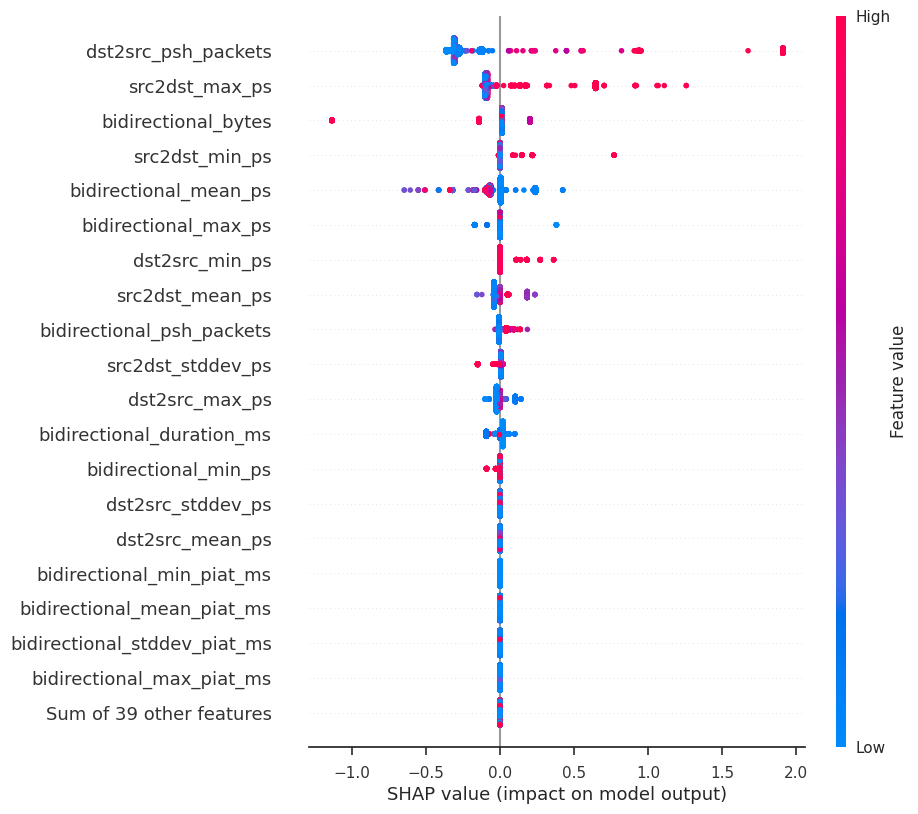

In [95]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

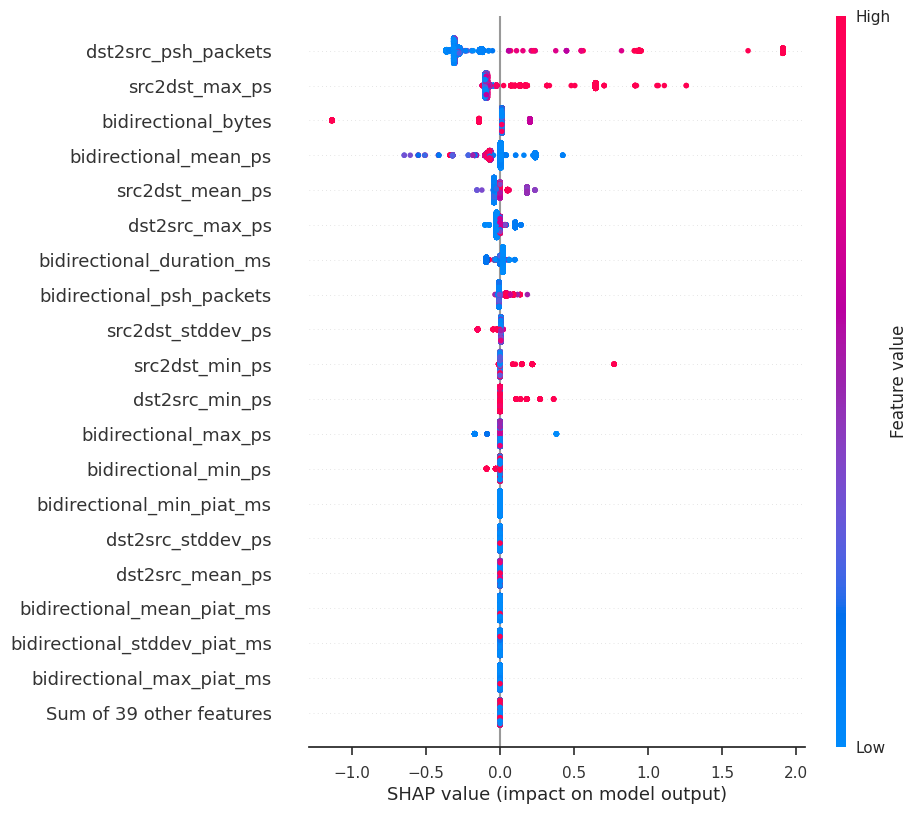

In [96]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Brute Force shap

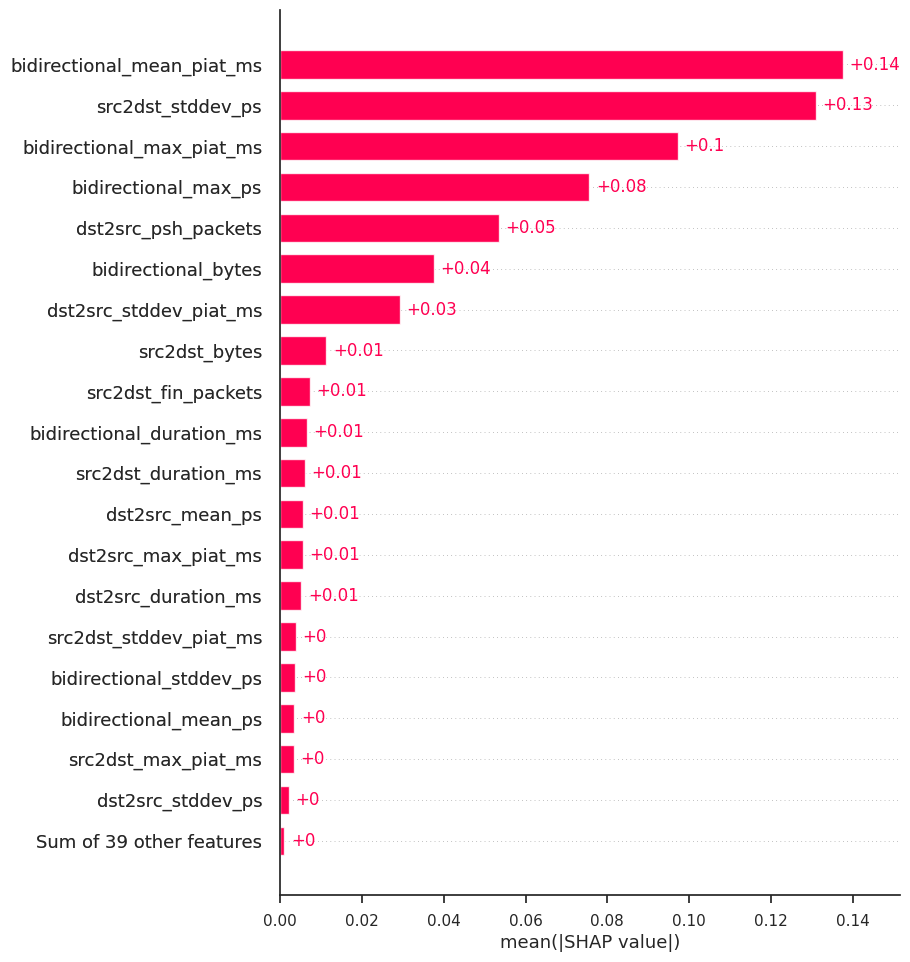

In [97]:
exp = Explanation(sv.values[:,:,12], 
                  sv.base_values[:,12], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

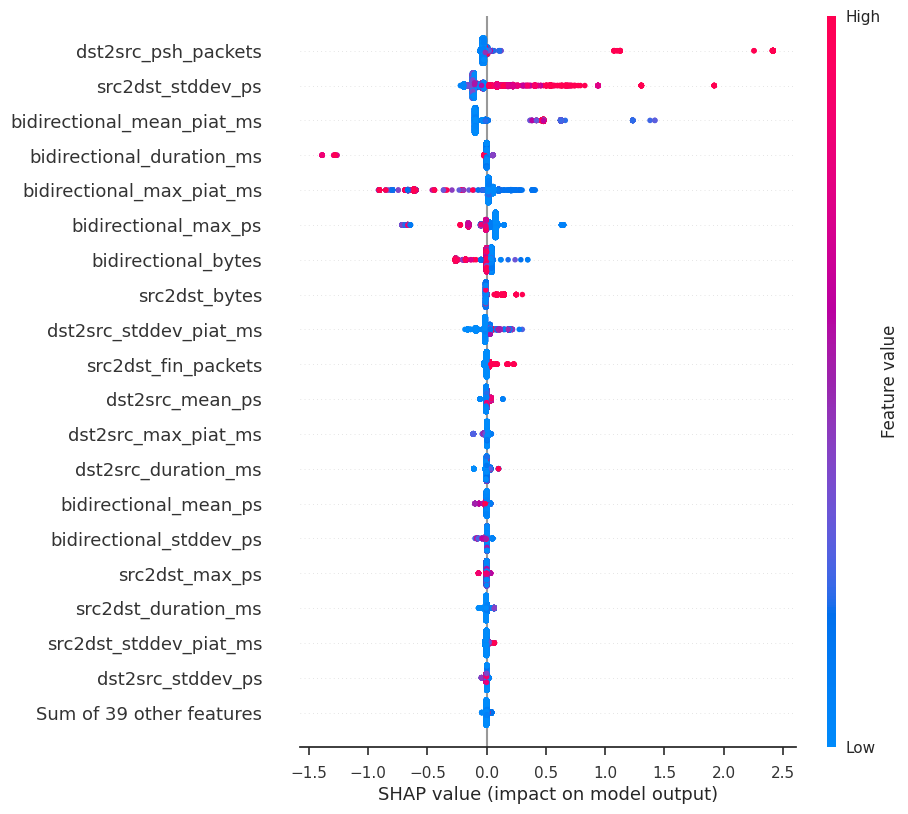

In [98]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

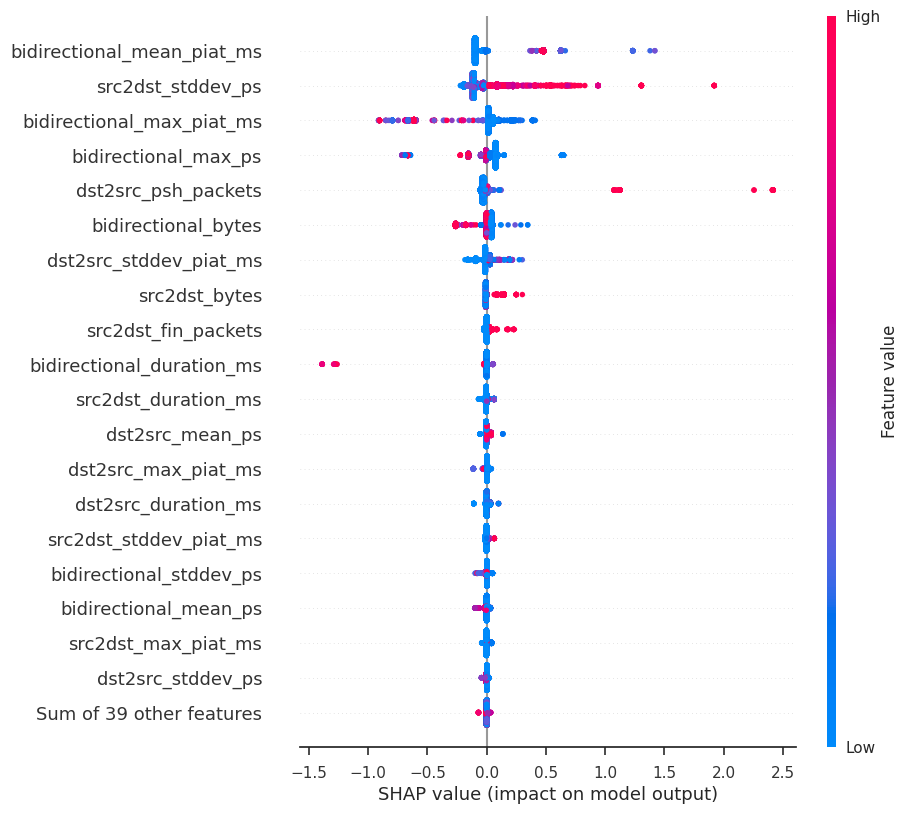

In [99]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - Sql Injection shap

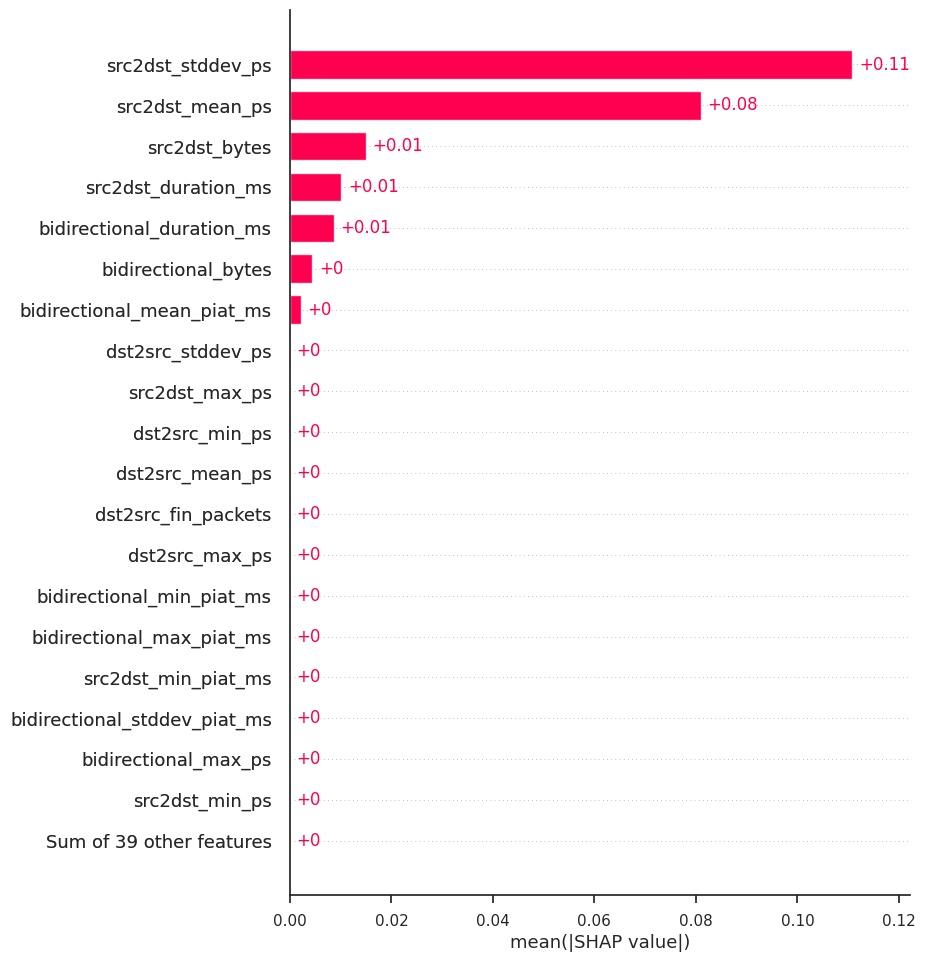

In [100]:
exp = Explanation(sv.values[:,:,13], 
                  sv.base_values[:,13], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

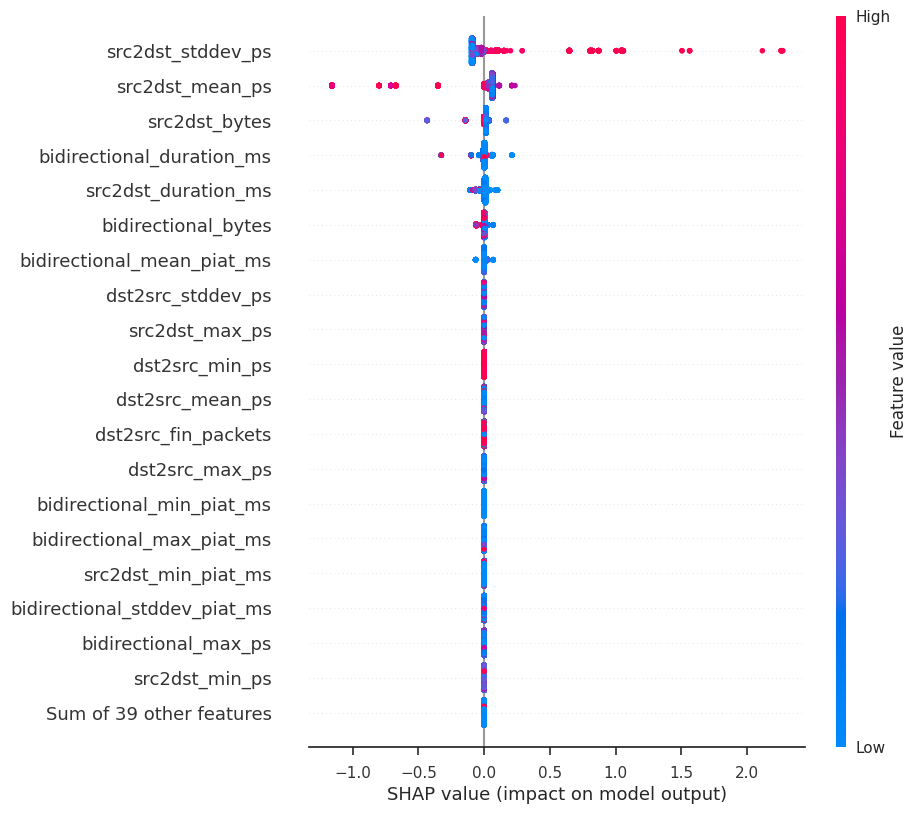

In [101]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

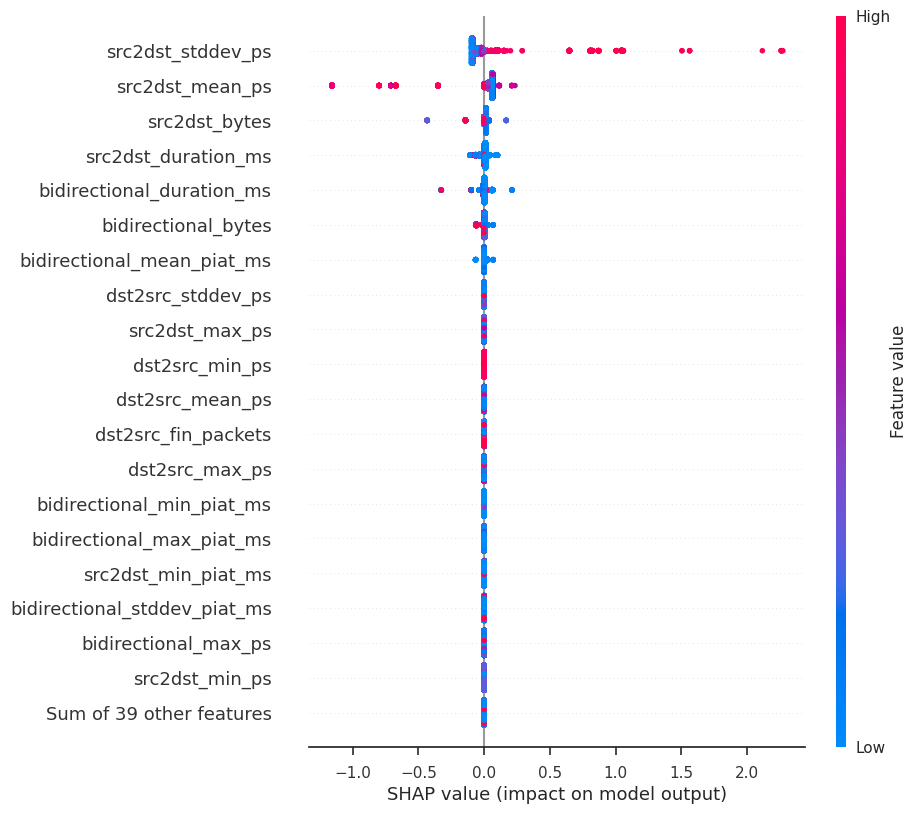

In [102]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Web Attack - XSS shap

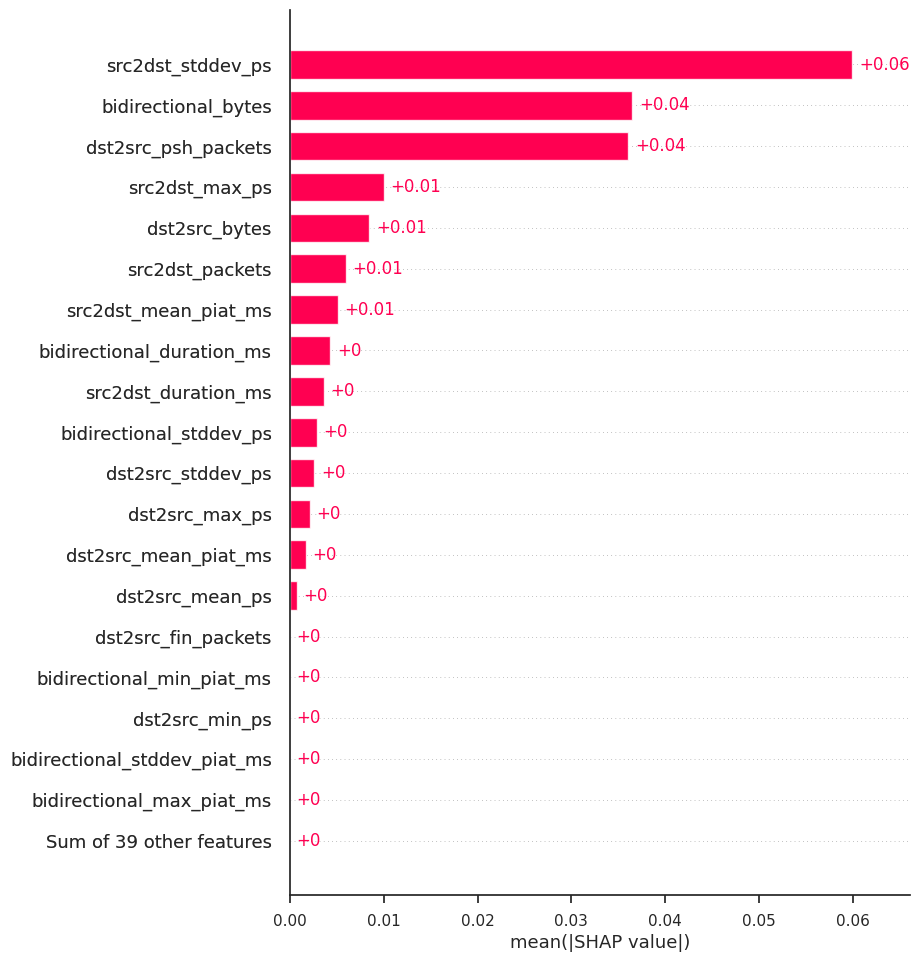

In [103]:
exp = Explanation(sv.values[:,:,14], 
                  sv.base_values[:,14], 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

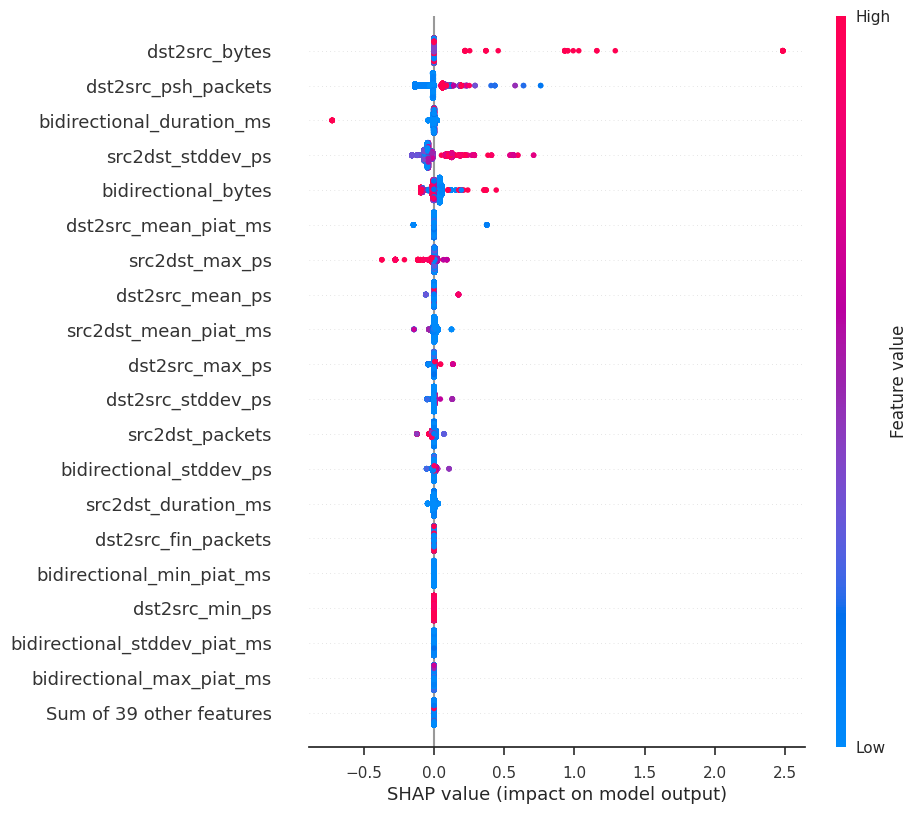

In [104]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

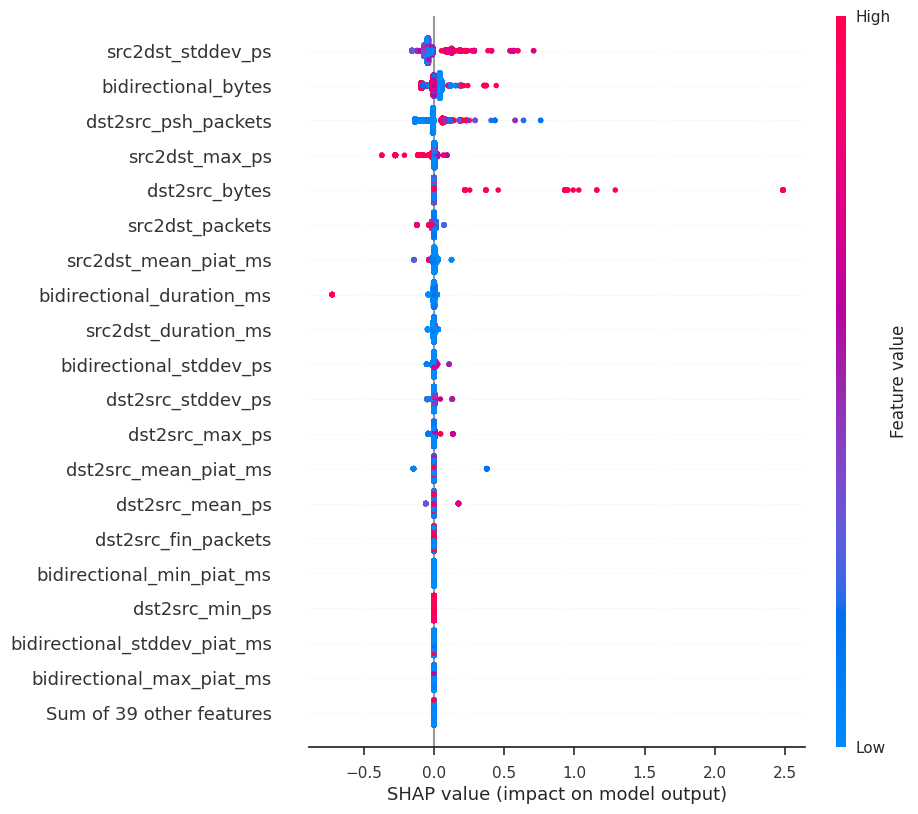

In [105]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Overall importance

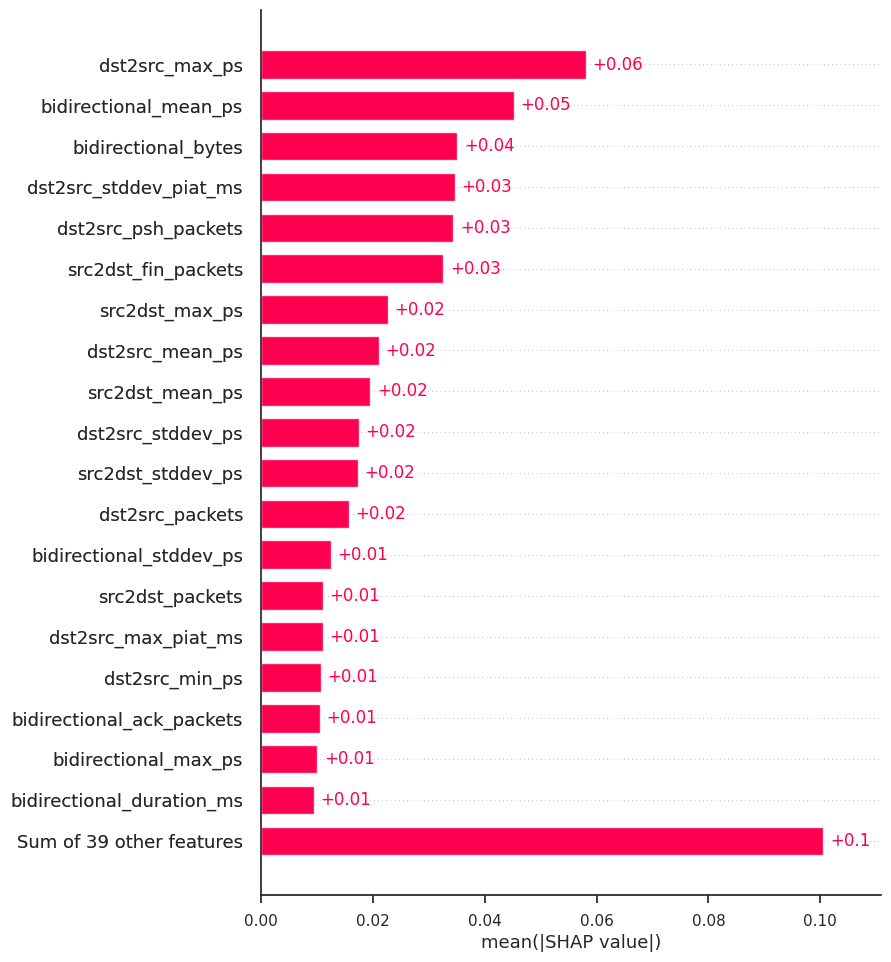

In [106]:
exp = Explanation(sv.values.mean(2), 
                  sv.base_values.mean(1), 
                  data=X_train, 
                  feature_names=X_res.columns)

plots.bar(exp, max_display=20, show=False)
# plt.savefig('tree/shap', dpi=1400, format='pdf', pad_inches=10)
plt.show()

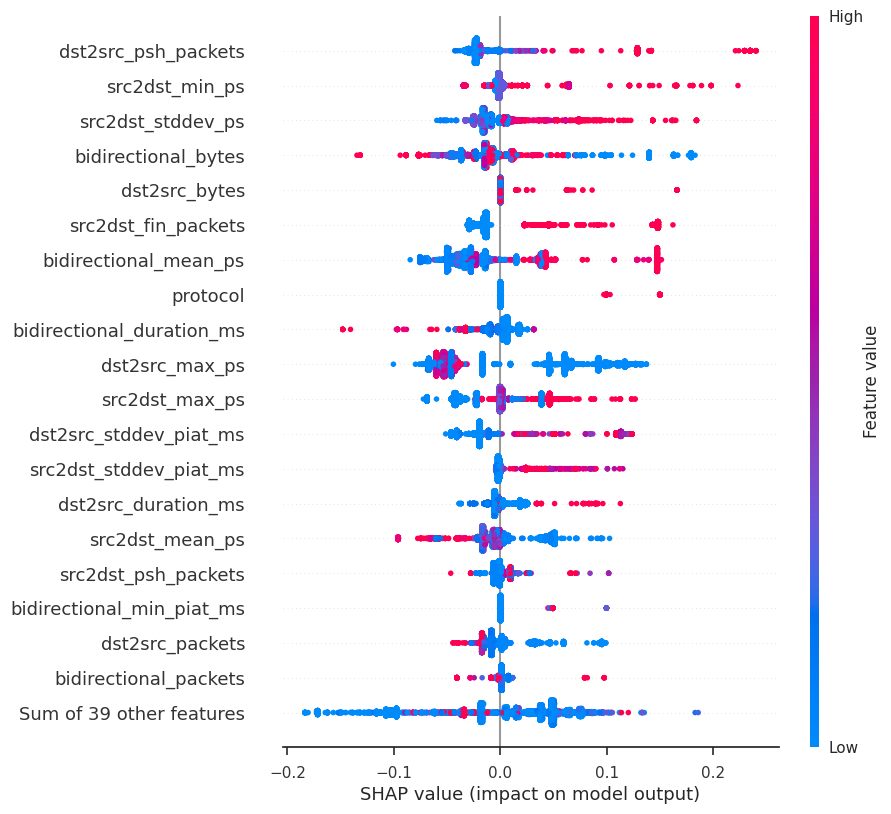

In [107]:
plots.beeswarm(exp,order=exp.abs.max(0),max_display=20)

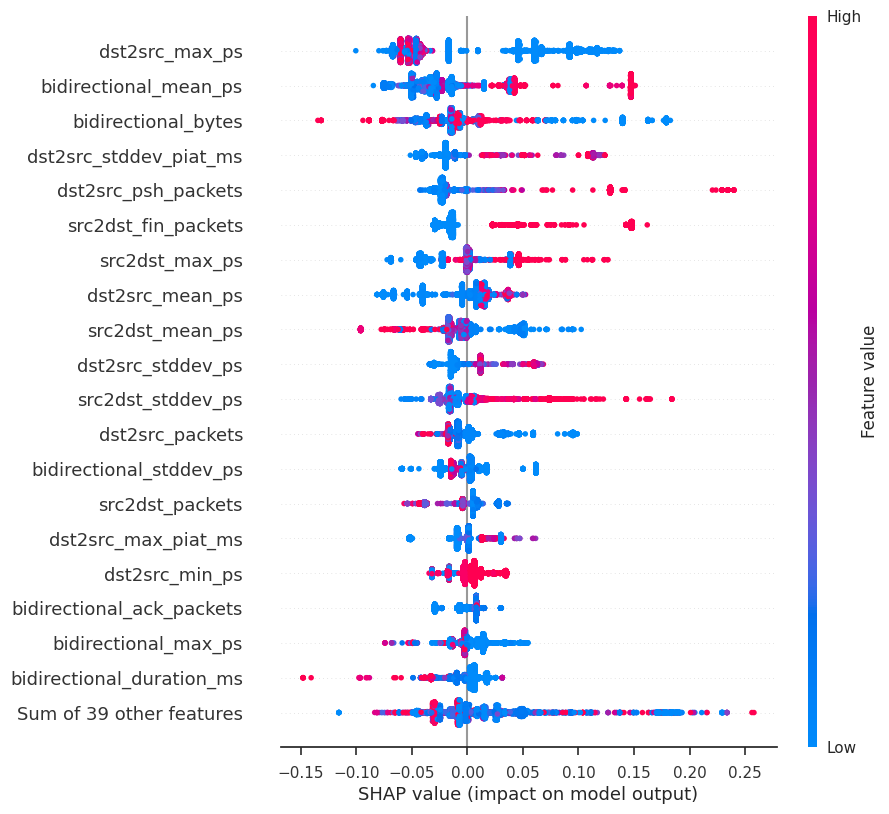

In [108]:
plots.beeswarm(exp,order=exp.abs.mean(0),max_display=20)

## Zero day test

In [109]:
classes = sorted(pd.unique(ds['label']).tolist())

In [110]:
removed_class = 1
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.988357,0.883049
1,PRECISION,0.988456,0.834840
2,RECALL,0.988357,0.883049
3,F1 SCORE,0.988269,0.851091


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


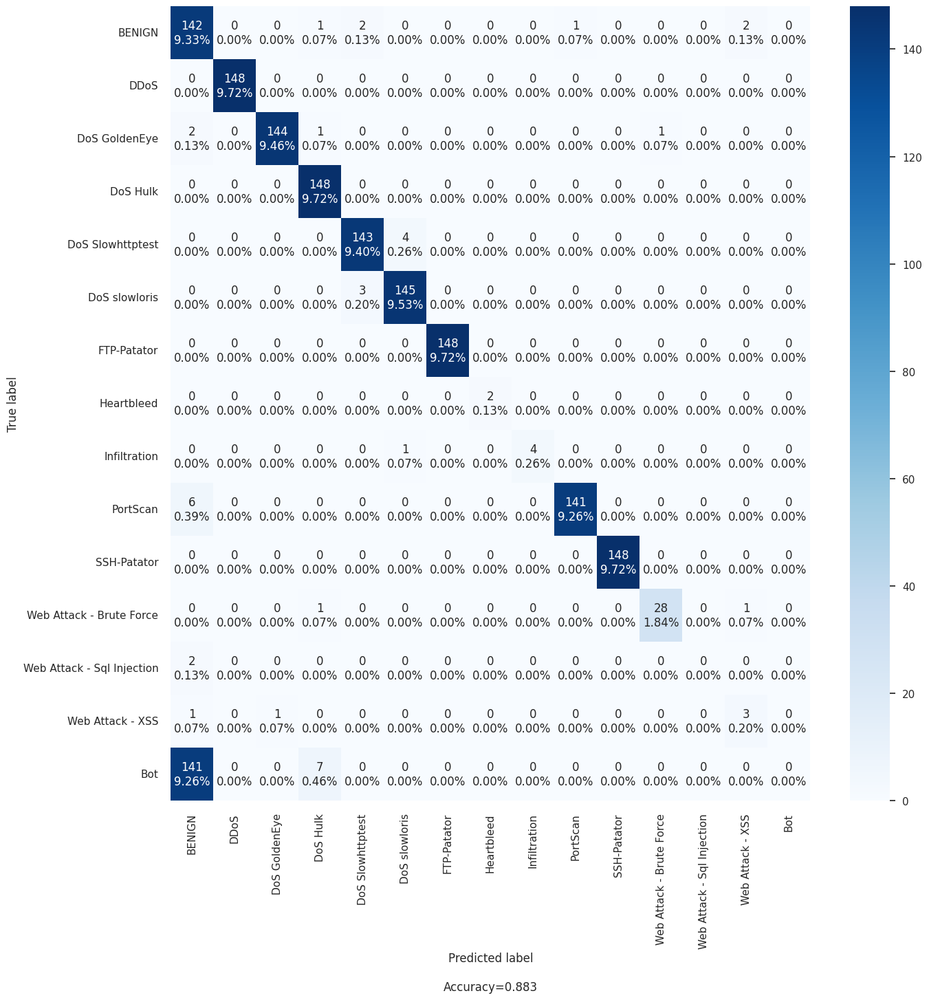

In [111]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'Bot'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [112]:
removed_class = 2
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.987812,0.880420
1,PRECISION,0.987942,0.834139
2,RECALL,0.987812,0.880420
3,F1 SCORE,0.987736,0.849147


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


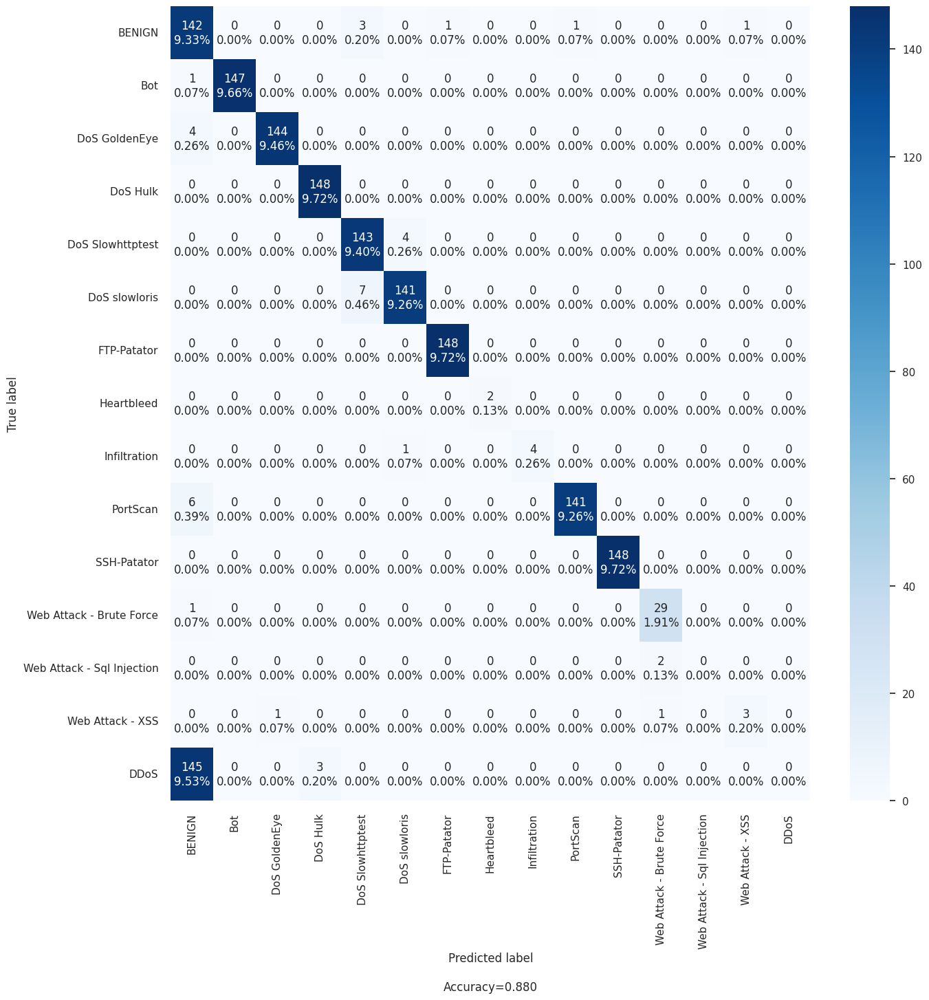

In [113]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DDoS'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [114]:
removed_class = 3
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.988175,0.886991
1,PRECISION,0.988315,0.825205
2,RECALL,0.988175,0.886991
3,F1 SCORE,0.988166,0.850779


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


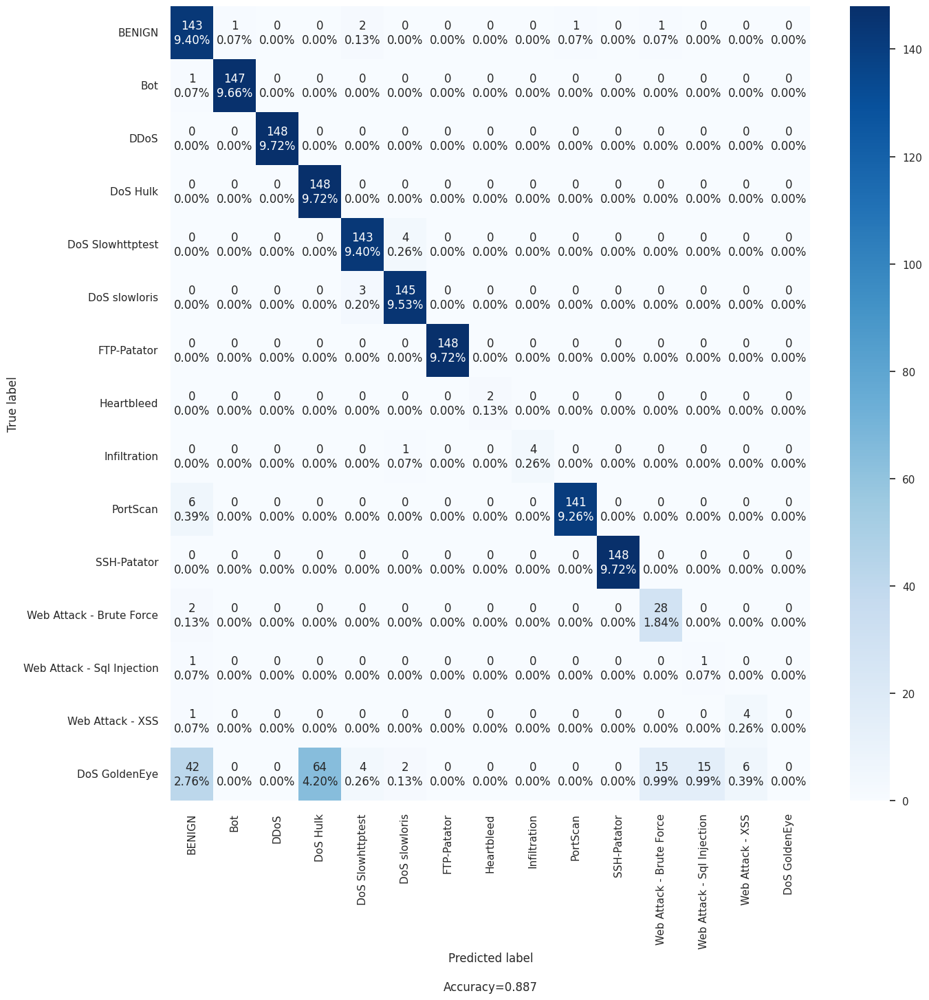

In [115]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS GoldenEye'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [116]:
removed_class = 4
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.987266,0.881735
1,PRECISION,0.987345,0.833220
2,RECALL,0.987266,0.881735
3,F1 SCORE,0.987240,0.848924


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


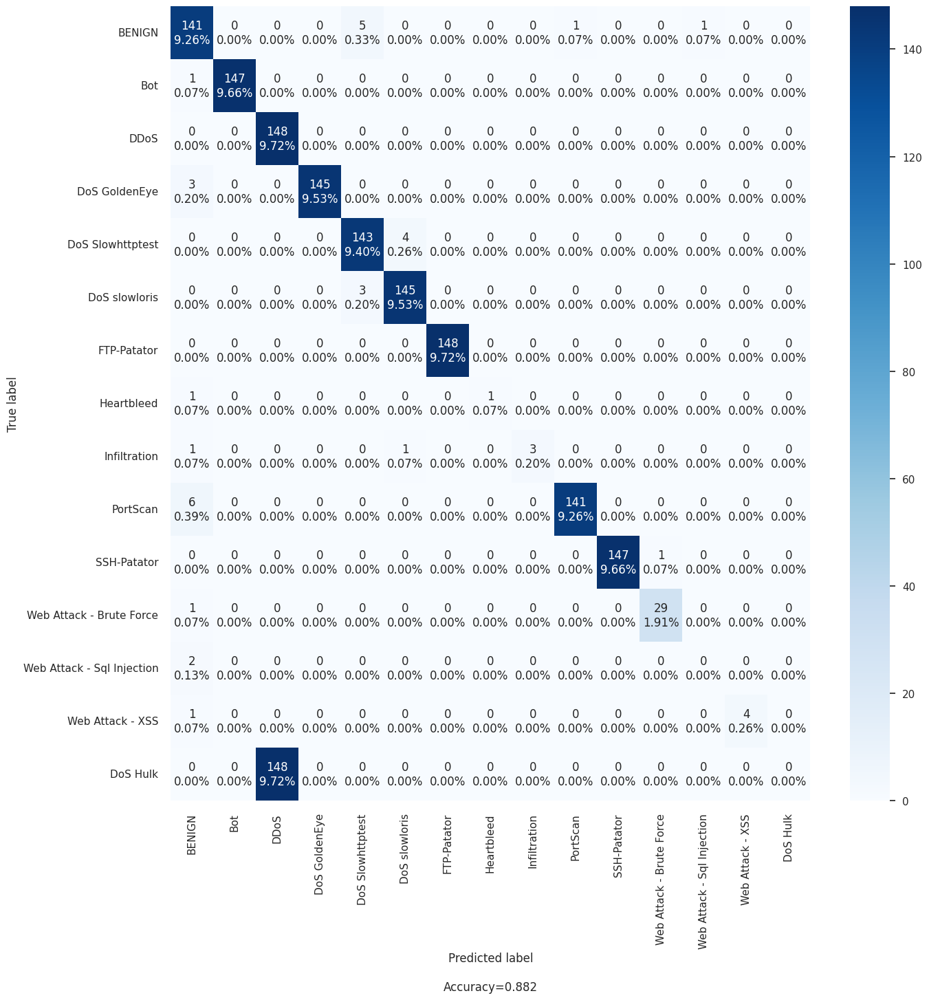

In [117]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS Hulk'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [118]:
removed_class = 5
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992176,0.886991
1,PRECISION,0.992283,0.838959
2,RECALL,0.992176,0.886991
3,F1 SCORE,0.992112,0.856894


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


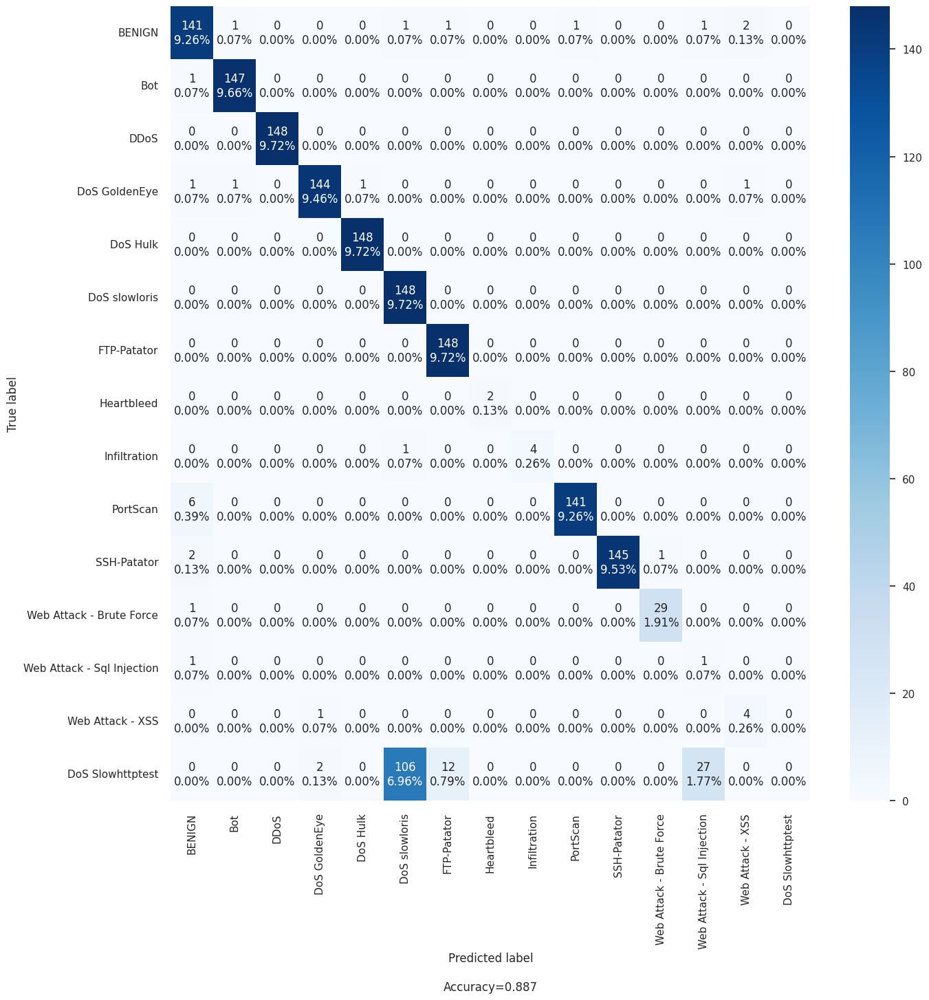

In [119]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS Slowhttptest'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [120]:
removed_class = 6
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992905,0.885677
1,PRECISION,0.992965,0.837920
2,RECALL,0.992905,0.885677
3,F1 SCORE,0.992856,0.852968


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


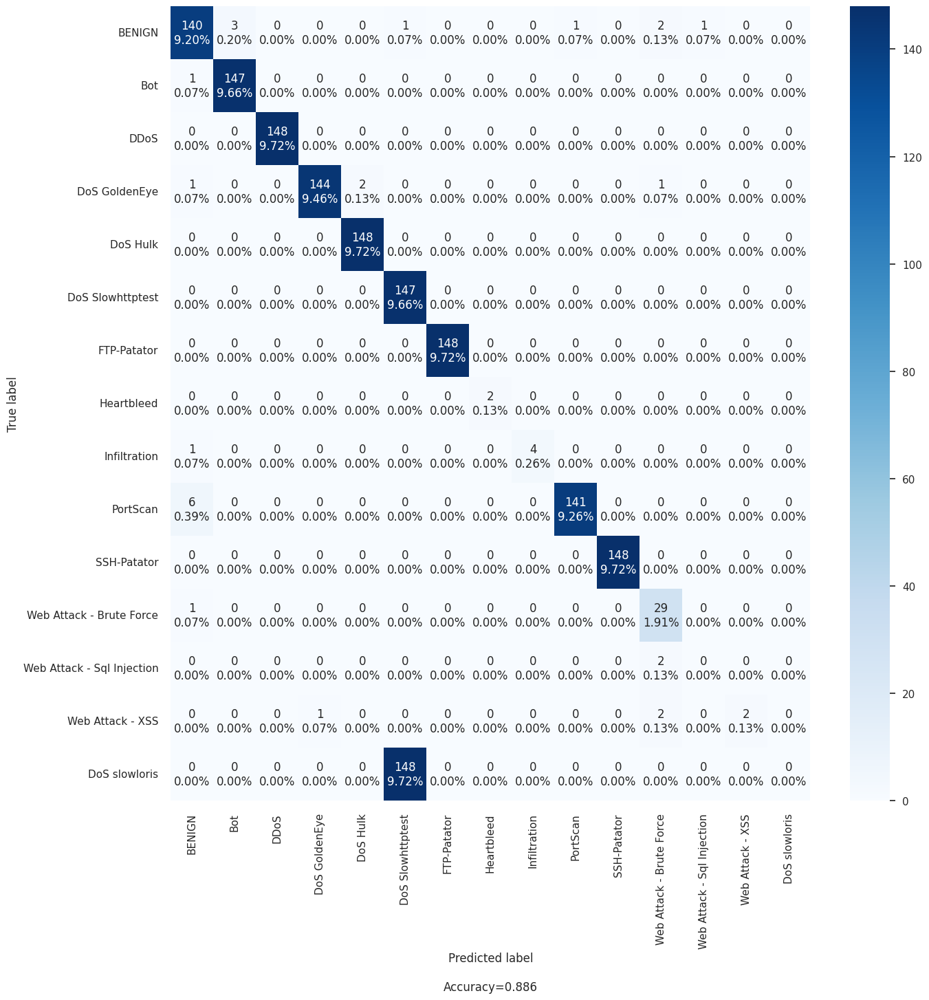

In [121]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'DoS slowloris'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [122]:
removed_class = 7
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.987266,0.881735
1,PRECISION,0.987429,0.820212
2,RECALL,0.987266,0.881735
3,F1 SCORE,0.987176,0.843628


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


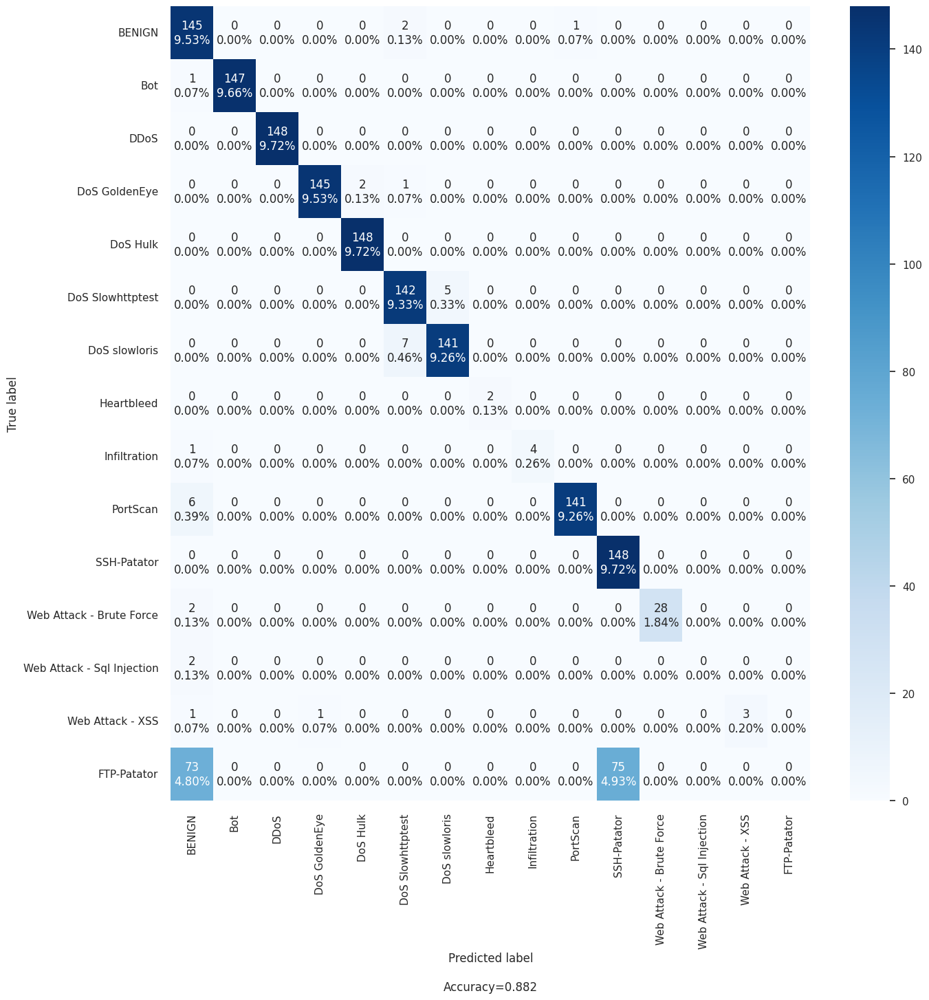

In [123]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'FTP-Patator'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [124]:
removed_class = 8
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.988319,0.974376
1,PRECISION,0.988421,0.972544
2,RECALL,0.988319,0.974376
3,F1 SCORE,0.988256,0.972797


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


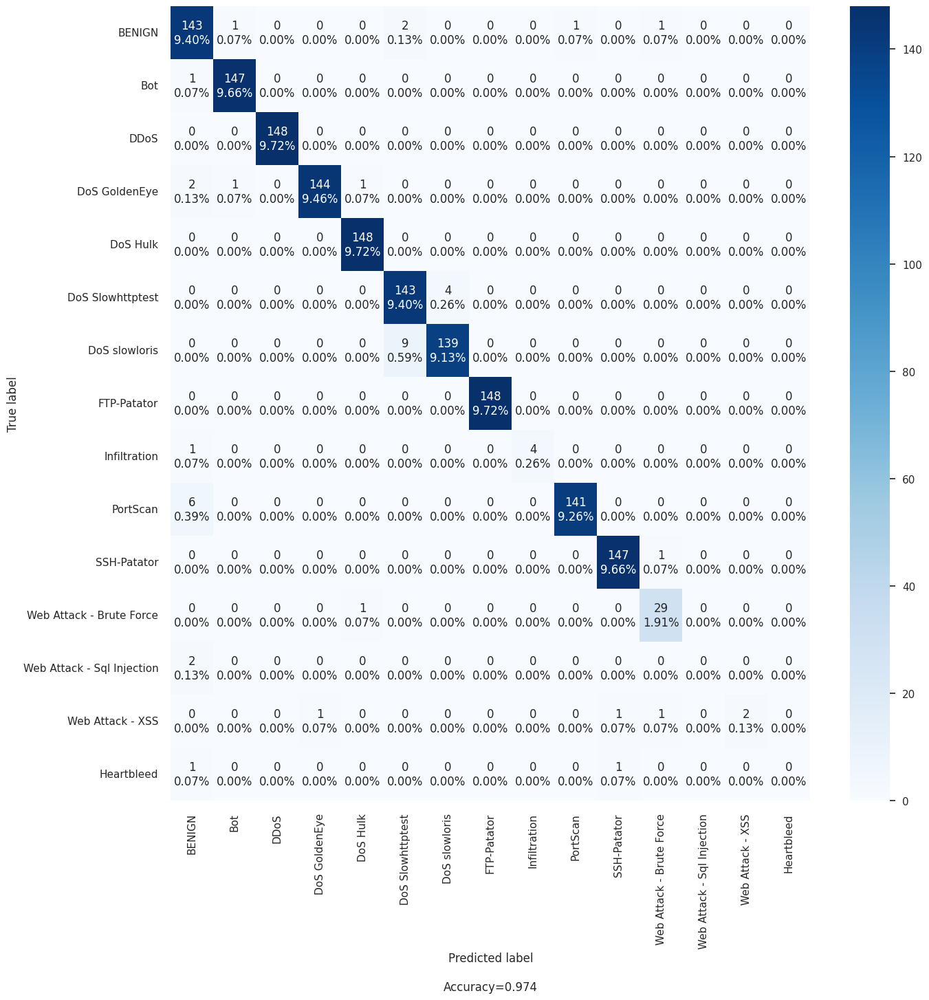

In [125]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'Heartbleed'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [126]:
removed_class = 9
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.990930,0.978318
1,PRECISION,0.991028,0.973746
2,RECALL,0.990930,0.978318
3,F1 SCORE,0.990865,0.975815


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


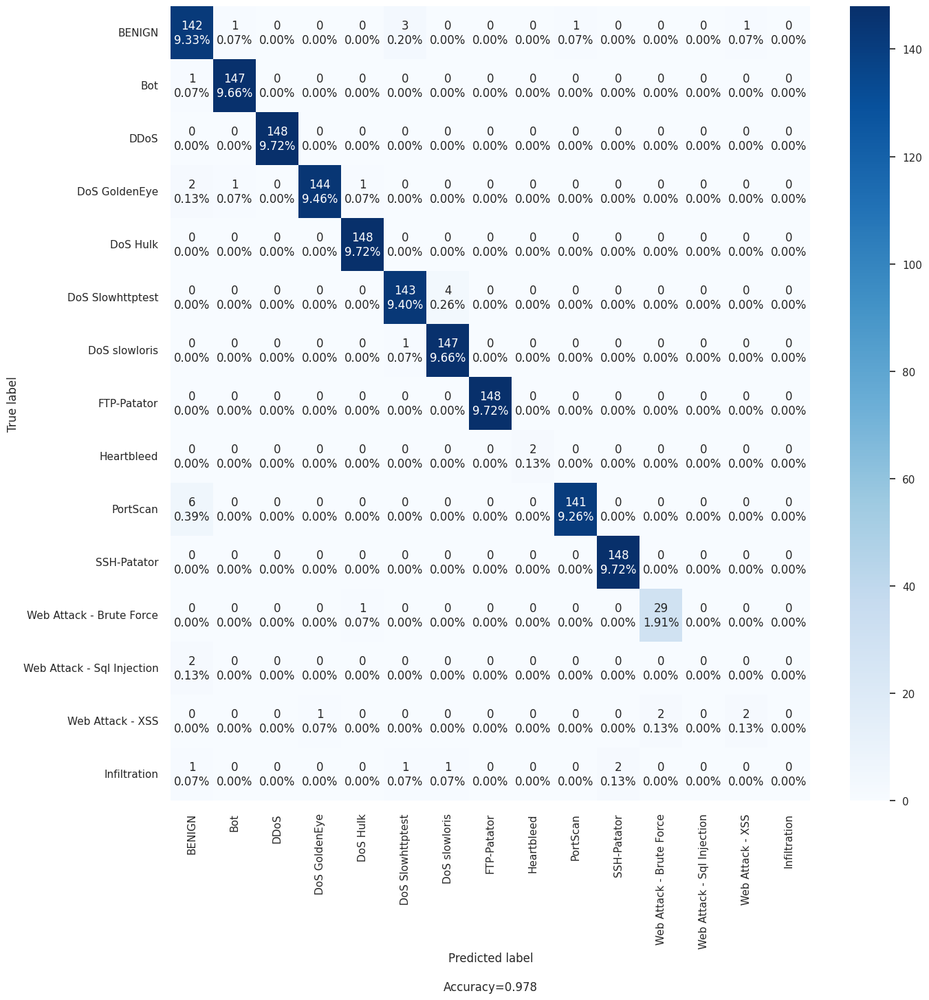

In [127]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'Infiltration'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [128]:
removed_class = 10
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.992904,0.890276
1,PRECISION,0.992971,0.845315
2,RECALL,0.992904,0.890276
3,F1 SCORE,0.992793,0.859007


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


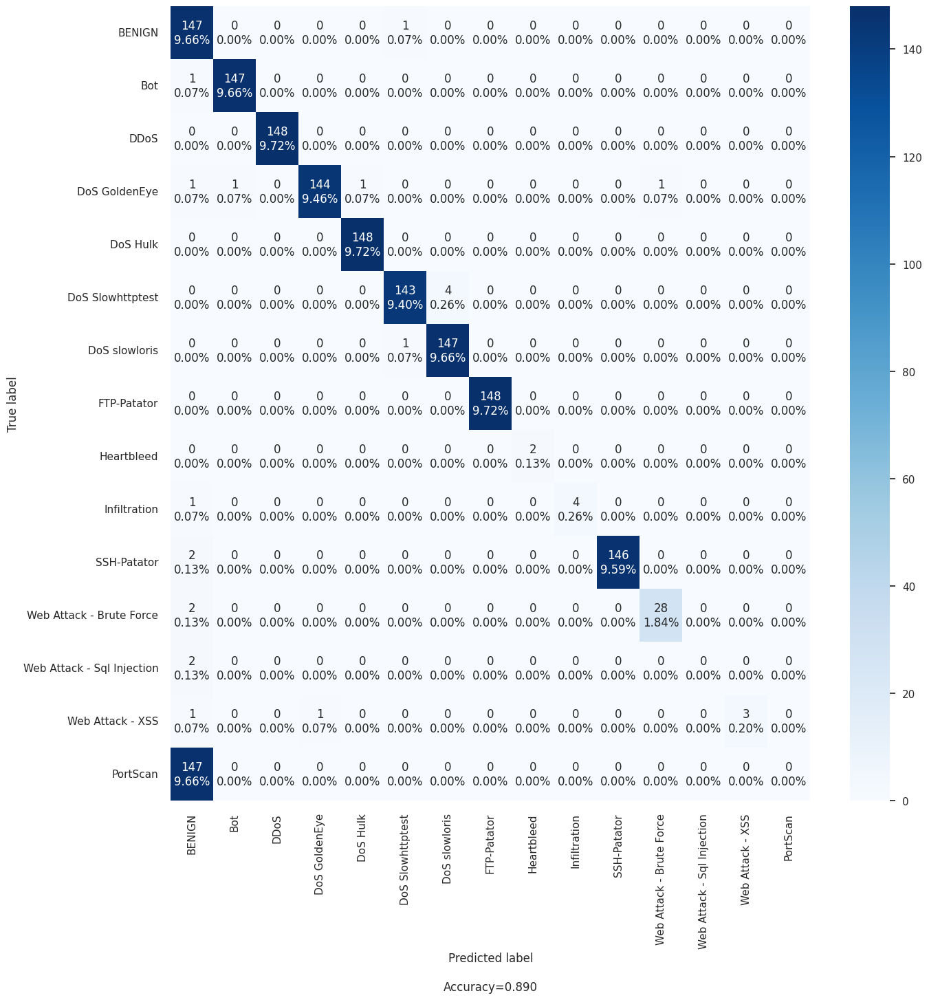

In [129]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'PortScan'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [130]:
removed_class = 11
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.984719,0.880420
1,PRECISION,0.984982,0.835823
2,RECALL,0.984719,0.880420
3,F1 SCORE,0.984640,0.849746


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


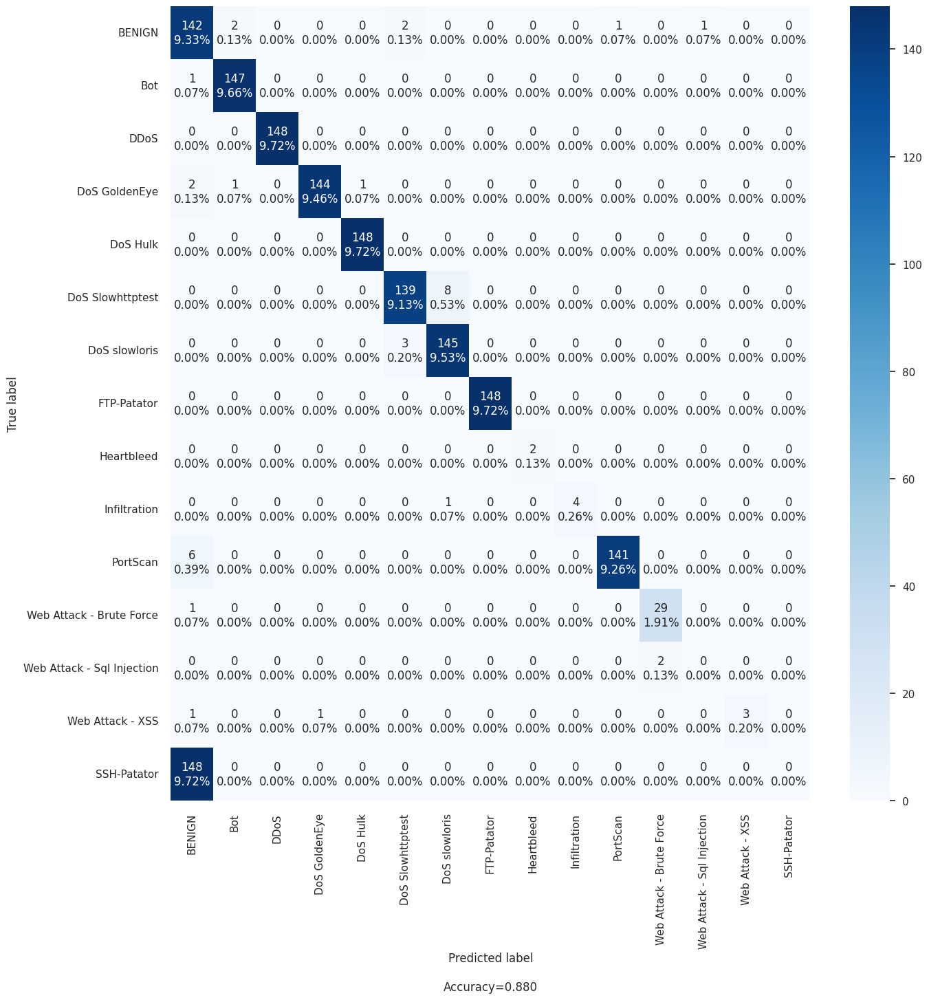

In [131]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS',
 'SSH-Patator'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [132]:
removed_class = 12
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.988770,0.957293
1,PRECISION,0.988905,0.948434
2,RECALL,0.988770,0.957293
3,F1 SCORE,0.988705,0.952140


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


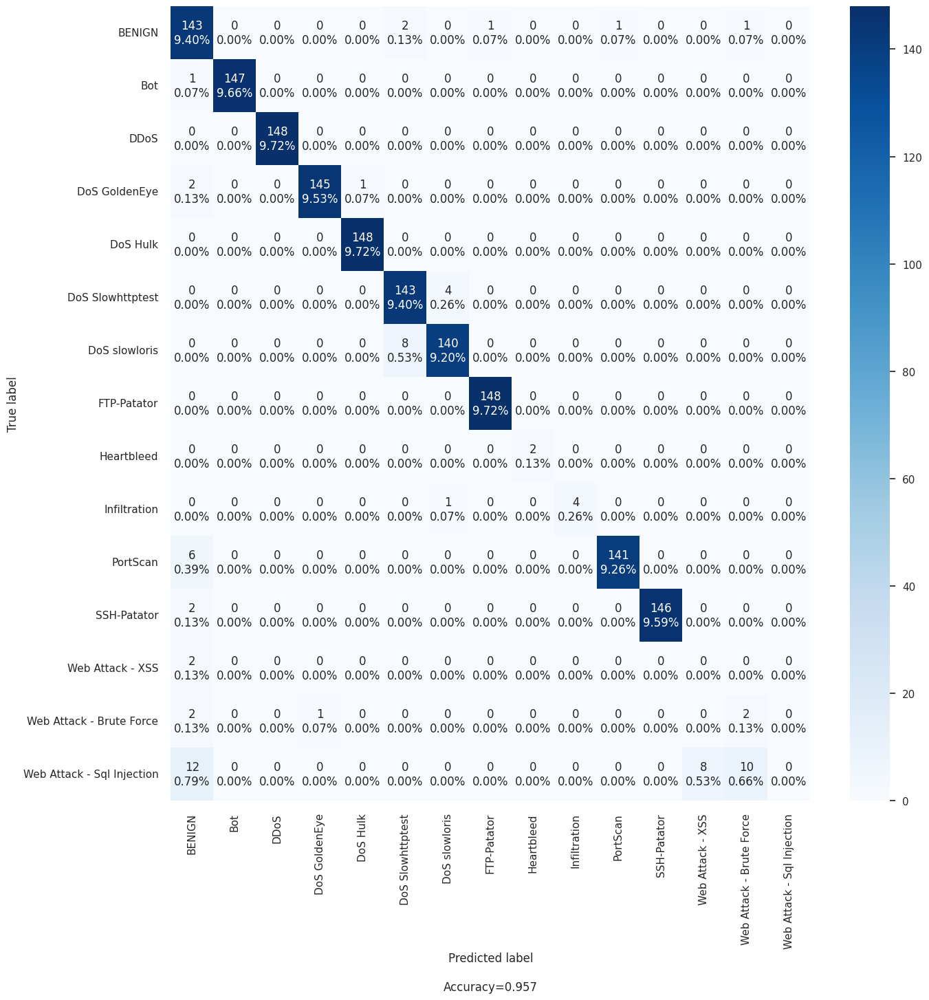

In [133]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - XSS',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [134]:
removed_class = 13
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.988646,0.975690
1,PRECISION,0.988750,0.974783
2,RECALL,0.988646,0.975690
3,F1 SCORE,0.988618,0.975045


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


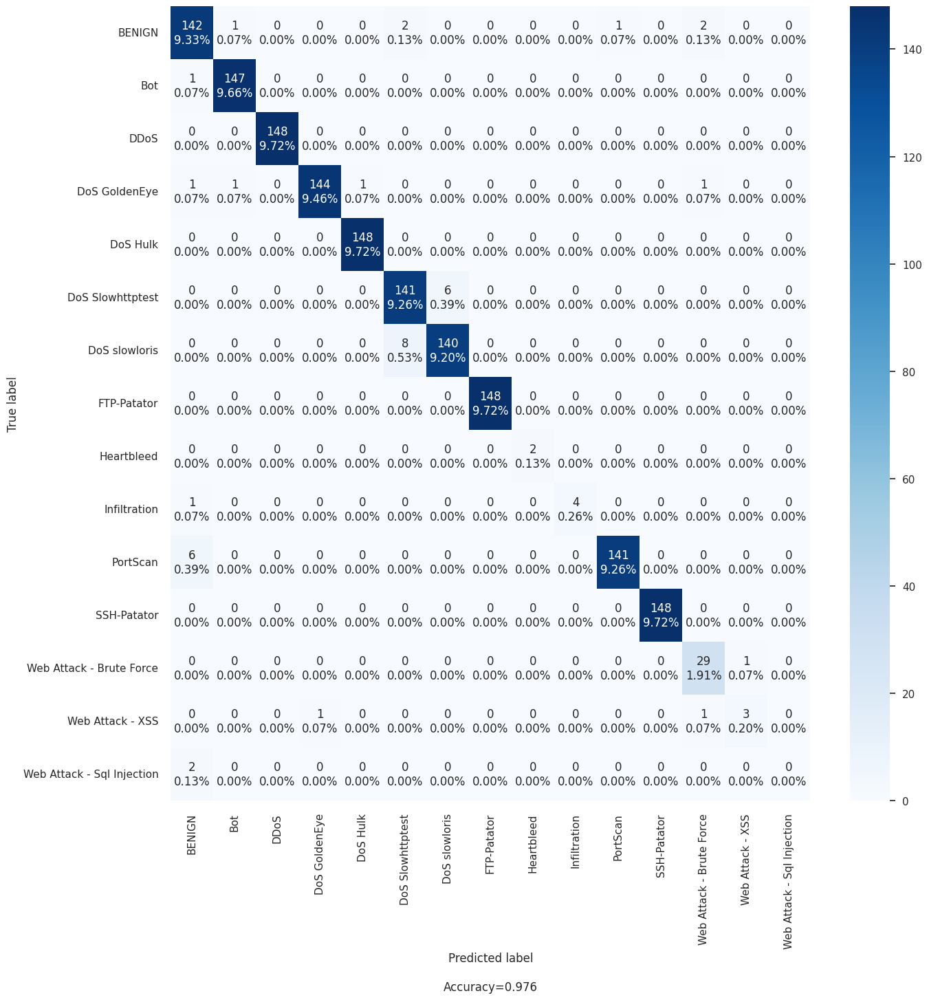

In [135]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - XSS',
 'Web Attack - Sql Injection',])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))

In [136]:
removed_class = 14
y_train_attack = y_train[y_train != removed_class]
X_train_attack = X_train[y_train != removed_class]
y_train_attack = np.where(y_train_attack > removed_class, y_train_attack - 1, y_train_attack)
bst.fit(X_train_attack, y_train_attack)
y_predicted_train = bst.predict(X_train_attack)
y_test_attack = np.where(y_test == removed_class, 15, y_test)
y_test_attack = np.where(y_test_attack > removed_class, y_test_attack - 1, y_test_attack)
y_predicted_test = bst.predict(X_test)
performanceMetricsDFWeighted(metrics, y_train_attack, y_predicted_train, y_test_attack, y_predicted_test, 'weighted')

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


,Measure,Train,Test
0,ACCURACY,0.989942,0.975033
1,PRECISION,0.990055,0.971538
2,RECALL,0.989942,0.975033
3,F1 SCORE,0.989901,0.973014


unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.


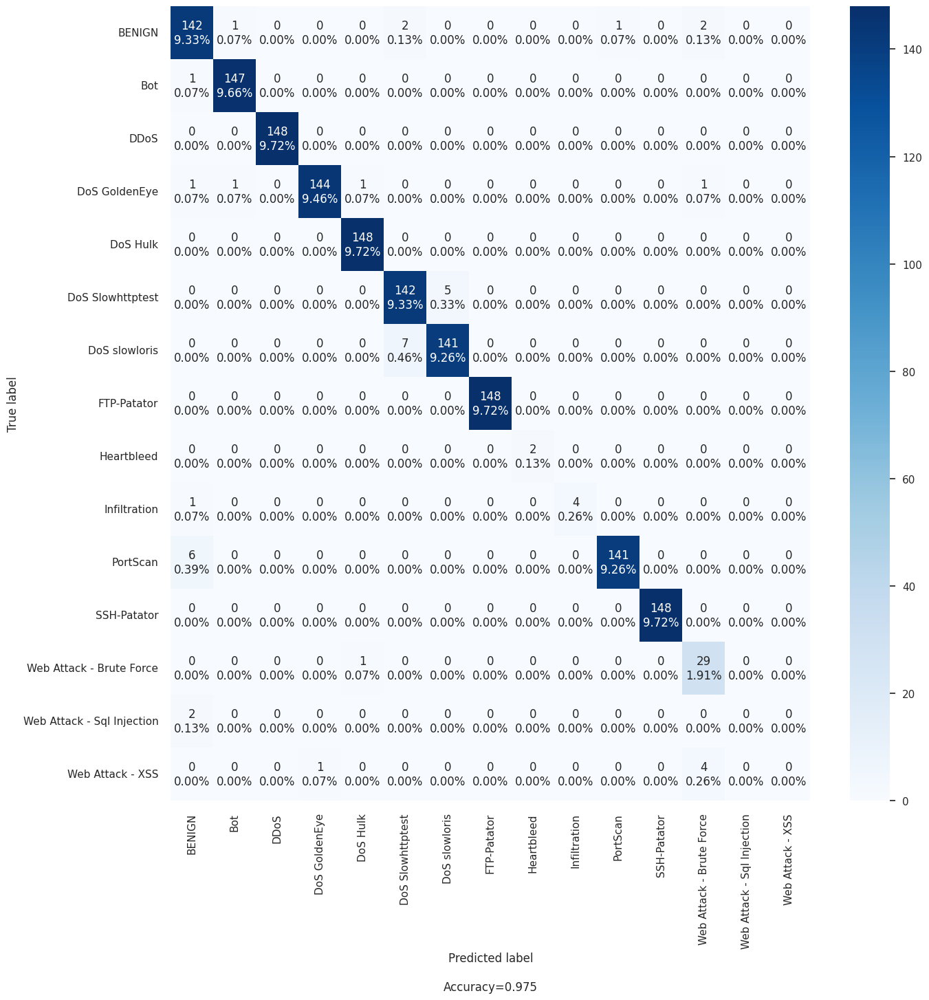

In [137]:
# Show the confusion matrix
cf = metrics.confusion_matrix(y_test_attack,y_predicted_test)
categories = pd.unique(['BENIGN',
 'Bot',
 'DDoS',
 'DoS GoldenEye',
 'DoS Hulk',
 'DoS Slowhttptest',
 'DoS slowloris',
 'FTP-Patator',
 'Heartbleed',
 'Infiltration',
 'PortScan',
 'SSH-Patator',
 'Web Attack - Brute Force',
 'Web Attack - Sql Injection',
 'Web Attack - XSS'])
make_confusion_matrix(cf, 
                      categories=categories,
                      cmap='Blues',
                      figsize=(15,15))